In [21]:
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


/mnt/home/ophilcox/mpivenv2/lib/python3.9/site-packages/IPython/core/magics/pylab.py:162: UserWarning: pylab import has clobbered these variables: ['f', 'power']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


### Analysis Code

In [2]:
## IMPORTS
import time, os, sys, healpy
import numpy as np
from classy import Class
sys.path.append('/mnt/home/ophilcox/PolyBin/')
import polybin as pb
from scipy.interpolate import InterpolatedUnivariateSpline

In [3]:
# if len(sys.argv)!=2:
# #    raise Exception("No option or sim-no input supplied!")
#     raise Exception("No index supplied!")
# option = int(sys.argv[1])//100+1
# sim_no = int(sys.argv[1])%100
# print("Option: %d, Sim-no: %d"%(option,sim_no))
option = 1
sim_no = 42

In [4]:
# HEALPix settings
Nside = 256
lmax = 3*Nside-1

# Whether to include a mask in practice
flat_mask = False
if option==1:
    print("Galactic mask")
elif option==2:
    print("Ones mask")
    flat_mask = True
else:
    raise Exception("Wrong option!")
    
pol=True
backend = 'libsharp'
outdir = '/mnt/ceph/users/ophilcox/polybin_testing/Tl/'
if not os.path.exists(outdir): os.makedirs(outdir)

# Bin edges (could also be non-linearly spaced)
power = 5./2.
#l_bins = np.asarray([2]+list(np.asarray(np.arange(4**(1./power),422**(1./power),14.0**(1./power))**power,dtype='int')))
#l_bins = np.asarray([2]+list(np.asarray(np.arange(5**(1./power),492**(1./power),8.0**(1./power))**power,dtype='int')))
l_bins = np.asarray([2]+list(np.asarray(np.arange(5**(1./power),502**(1./power),20.0**(1./power))**power,dtype='int')))
Nl = len(l_bins)-1
print("binned lmax: %d, HEALPix lmax: %d"%(np.max(l_bins),lmax))
assert lmax>np.max(l_bins)

# Number of random iterations to create Fisher matrix
N_it = 100 # N ~ 50 is sufficient in practice, we'll use 10 for testing
#assert sim_no<=10*N_it-10, "Sim number must be at most %d"%(10*N_it) 

# Number of simulations to use for testing
N_sim = 1000
#assert sim_no<=100*N_sim-100, "Sim number must be at most %d"%(100*N_sim) 

# Whether to include the pixel window function
# This should be set to True, unless we generate maps at the same realization we analyze them!
include_pixel_window = False

# Whether to include bins only partially satisfying triangle conditions
include_partial_triangles = False

Galactic mask
binned lmax: 483, HEALPix lmax: 767


In [5]:
# Galactic Mask
# Using GAL040 mask with 2-degree apodization for testing
root = '/mnt/home/ophilcox/ceph/Oliver/planck/'
maskfile = 'HFI_Mask_GalPlane-apo2_2048_R2.00.fits'

cosmo = Class()

# Define ell arrays
l = np.arange(lmax+1)

# Run CLASS
cosmo.set({'output':'tCl,lCl,pCl,mPk','l_max_scalars':lmax+1,'lensing':'yes',
           'omega_b':0.022383,
           'non linear':'no',
           'omega_cdm':0.12011,
           'h':0.6732,
           'm_ncdm':0.06,
           'N_ncdm':1,
           'tau_reio':0.0543,
           'A_s':1e-10*np.exp(3.0448),
           'n_s':0.96605});
cosmo.compute()

# Compute dictionary of signal C_ell (note that we use all real fields by convention)
Cl_dict = cosmo.lensed_cl(lmax);
Cl_th = {}
if pol:
    r_TB = 0.5 # correlation of T and B (usually set to zero)
    r_EB = 0.5 # correlation of E and B (usually set to zer0)
    Cl_th = {}
    Cl_th['TT'] = Cl_dict['tt']*cosmo.T_cmb()**2
    Cl_th['TE'] = Cl_dict['te']*cosmo.T_cmb()**2
    Cl_th['TB'] = r_TB*np.sqrt(Cl_dict['tt']*Cl_dict['bb'])*cosmo.T_cmb()**2
    Cl_th['EE'] = Cl_dict['ee']*cosmo.T_cmb()**2
    Cl_th['EB'] = r_EB*np.sqrt(Cl_dict['ee']*Cl_dict['bb'])*cosmo.T_cmb()**2
    Cl_th['BB'] = Cl_dict['bb']*cosmo.T_cmb()**2
else:
    Cl_th['TT'] = Cl_dict['tt']*cosmo.T_cmb()**2
    
# Compute noise C_ell
DeltaT = 60./60.*np.pi/180.*1e-6 # in K-radians
DeltaP = 60./60.*np.pi/180.*1e-6*np.sqrt(2) 
thetaFWHM = 5./60.*np.pi/180. # in radians
NlT = DeltaT**2*np.exp(l*(l+1)*thetaFWHM**2/(8.*np.log(2)))*(l>=2)
NlP = DeltaP**2*np.exp(l*(l+1)*thetaFWHM**2/(8.*np.log(2)))*(l>=2)
Nl_th = {}
if pol:
    Nl_th['TT'] = NlT
    Nl_th['TE'] = Nl_th['TB'] = Nl_th['EB'] = 0.*NlT
    Nl_th['EE'] = Nl_th['BB'] = NlP
else:
    Nl_th['TT'] = NlT

if flat_mask:
    mask = 1.+0*healpy.ud_grade(healpy.read_map(root+maskfile,field=1),Nside)
else:
    mask = healpy.ud_grade(healpy.read_map(root+maskfile,field=1),Nside)
    
# Define fiducial beam and signal+noise
if not pol:
    beam = [1.+0.*l]
else:
    beam = [1.+0.*l, 1.+0.*l] # Temperature and polarization
Sl_fiducial = {}
for f in Cl_th.keys(): Sl_fiducial[f] = beam[0]**2*Cl_th[f]+Nl_th[f]+(Cl_th[f][2]+Nl_th[f][2])*(l<2) # avoiding zeros at l<2

# Define class, optionally including polarization
base = pb.PolyBin(Nside, Sl_fiducial, beam, include_pixel_window=include_pixel_window, pol=pol, backend=backend)

## Caution: not accounting for pixel window function


In [6]:
# Generate unmasked data with known C_l and factorized b
# Cl^XY are set to the fiducial spectrum unless otherwise specified
# No beam is included
print("Generating data")
raw_data = base.generate_data(seed=42, add_B=False)

# Mask the map
data = (raw_data*mask).reshape(len(raw_data),-1)

def applySinv(input_map, input_type='map', output_type='map'):
    """Apply the quasi-optimal weighting, S^{-1} to a map in map- or harmonic-space. 
    
    Here, we assume that the forward covariance is diagonal in ell (though not in fields), in particular C_l, and invert this.
    This is not quite the exact solution (as it incorrectly treats W(n) factors), but will be unbiased.
    
    Note that the code has two input and output options: "harmonic" or "map", to avoid unnecessary transforms.
    """
    assert input_type in ['harmonic','map'], "Valid input types are 'harmonic' and 'map' only!"
    assert output_type in ['harmonic','map'], "Valid output types are 'harmonic' and 'map' only!"
    
    # Transform to harmonic space, if necessary
    if input_type=='map': input_map_lm = base.to_lm(input_map)
    else: input_map_lm = input_map.copy()
    
    # Divide by covariance
    Cinv_data_lm = np.einsum('ijk,jk->ik',base.inv_Cl_lm_mat,input_map_lm,order='C')
        
    # Return to map-space, if necessary
    if output_type=='map': return base.to_map(Cinv_data_lm)
    else: return Cinv_data_lm
    
# Initialize power spectrum class

# Define fields to use
#fields=['TTT','TTE','TB','EE','EB','BB'] # can use any subset of these!
fields = ['TTTT', 'TTTE', 'TTEE', 'TETE', 'TEEE', 'EEEE', 'TTTB', 'TTEB', 'TETB', 'TEEB', 'TBEE', 'EEEB']

# NB: use mask = 1.+0.*mask if including mask projection in S^-1 (as in applySinv_planck)
tspec = pb.TSpec(base, mask, applySinv, l_bins, l_bins_squeeze=l_bins, L_bins=l_bins, 
                    fields=fields, parity='both')
tspec._compute_symmetry_factor()

Generating data
## Caution: Maximum l is greater than HEALPix-lmax/2; this might cause boundary effects.
Binning: 4 bins in [2, 483]
Mask: spatially varying
Using 24 combination(s) of fields/parities
Using a maximum of 126 bins per field/parity
Using a total of 1996 bins


### Load Fisher and data

In [7]:
option = 2

outdir = '/mnt/home/ophilcox/ceph/polybin_testing/Tl/'

In [23]:
# ### Load Fisher
# fish = 0.
# ct = 0.
# for i in range(10):
#     x = np.load(outdir+'Tl_fish%d_%d.npy'%(option,i))
#     fish+=np.load(outdir+'Tl_fish%d_%d.npy'%(option,i))
#     ct += 1
# fish= fish.mean(axis=0)/ct
# np.save(outdir+'Tl_fish%d.npy'%option,fish)

fish = np.load(outdir+'Tl_fish%d.npy'%option)
inv_fish = np.linalg.inv(fish)

In [130]:
# fish_ideal = bspec.compute_fisher_ideal(verb=True)
# np.save(outdir+'Bl_fish_ideal%d.npy'%option,fish_ideal)

print("Replacing ideal Fisher matrix with unwindowed full Fisher") 
#fish_ideal = np.load(outdir+'Tl_ideal%d.npy'%option)
fish_ideal = np.load(outdir+'Tl_fish2.npy')
inv_fish_ideal = np.linalg.inv(fish_ideal)

Replacing ideal Fisher matrix with unwindowed full Fisher


In [24]:
### Load ideal
ideal = []
for i in range(100):
    try:
        ideal.append(np.load(outdir+'Tl_ideal%d_%d.npy'%(option,i)))
    except IOError:
        pass
ideal = np.concatenate(ideal)
ideal = np.asarray([inv_fish_ideal@ideal1.reshape(-1) for ideal1 in ideal])
print("Using %d ideal simulations"%len(ideal))
ideal_cov = np.cov(ideal.T)

ValueError: need at least one array to concatenate

In [25]:
### Load unwindowed (4-field)
unwindowed4 = []
for i in range(100):
    #if option==2 and (i==2 or i==45 or i==47): continue
    try:
        unwindowed4.append(np.load(outdir+'Tl_unwindowed_4field%d_%d.npy'%(option,i)))
    except IOError:
        pass
unwindowed4_num = np.concatenate(unwindowed4)
print("Using %d unwindowed 4-field simulations"%len(unwindowed4_num))
unwindowed4 = np.asarray([inv_fish@unwindowed1.ravel() for unwindowed1 in unwindowed4_num])
unwindowed4_cov = np.cov(unwindowed4.reshape(len(unwindowed4),-1).T)

Using 50 unwindowed 4-field simulations


In [26]:
### Load unwindowed (0-field)
unwindowed0 = []
for i in range(100):
    #if option==2 and (i==2 or i==45 or i==47): continue
    try:
        unwindowed0.append(np.load(outdir+'Tl_unwindowed_0field%d_%d.npy'%(option,i)))
    except IOError:
        pass
unwindowed0_num = np.concatenate(unwindowed0)
print("Using %d unwindowed 0-field simulations"%len(unwindowed0_num))
unwindowed0 = np.asarray([inv_fish@unwindowed1.ravel() for unwindowed1 in unwindowed0_num])
unwindowed0_cov = np.cov(unwindowed4.reshape(len(unwindowed4),-1).T)

Using 50 unwindowed 0-field simulations


In [27]:
### Load unwindowed
unwindowed = []
for i in range(100):
    try:
        unwindowed.append(np.load(outdir+'Tl_unwindowed%d_%d.npy'%(option,i)))
    except IOError:
        pass
unwindowed_num = np.concatenate(unwindowed)
print("Using %d unwindowed simulations"%len(unwindowed_num))
unwindowed = np.asarray([inv_fish@unwindowed1.ravel() for unwindowed1 in unwindowed_num])
unwindowed_cov = np.cov(unwindowed.reshape(len(unwindowed),-1).T)

Using 50 unwindowed simulations


In [28]:
Tl_ideal_all, Tl_unwindowed4_all, Tl_unwindowed0_all, Tl_unwindowed_all = {},{},{},{}
tspec._compute_symmetry_factor()
index, config_index = 0,0
chi_name = {1:'+',-1:'-'}
for chi in tspec.chi_arr:
    # Iterate over fields
    for u in tspec.fields:
        Tl_unwindowed4_all['%s'%u+'%s'%chi_name[chi]] = unwindowed4[:,index:index+len(tspec.sym_factor_all[config_index])]
        Tl_unwindowed0_all['%s'%u+'%s'%chi_name[chi]] = unwindowed0[:,index:index+len(tspec.sym_factor_all[config_index])]
        Tl_unwindowed_all['%s'%u+'%s'%chi_name[chi]] = unwindowed[:,index:index+len(tspec.sym_factor_all[config_index])]
        #Tl_ideal_all['%s'%u+'%s'%chi_name[chi]] = ideal[:,index:index+len(tspec.sym_factor_all[config_index])]
        index += len(tspec.sym_factor_all[config_index])
        config_index += 1

Using 24 combination(s) of fields/parities
Using a maximum of 126 bins per field/parity
Using a total of 1996 bins


### currently ideal Fisher is many orders of magnitude wrong..

### Plots

NameError: name 'inv_fish_ideal' is not defined

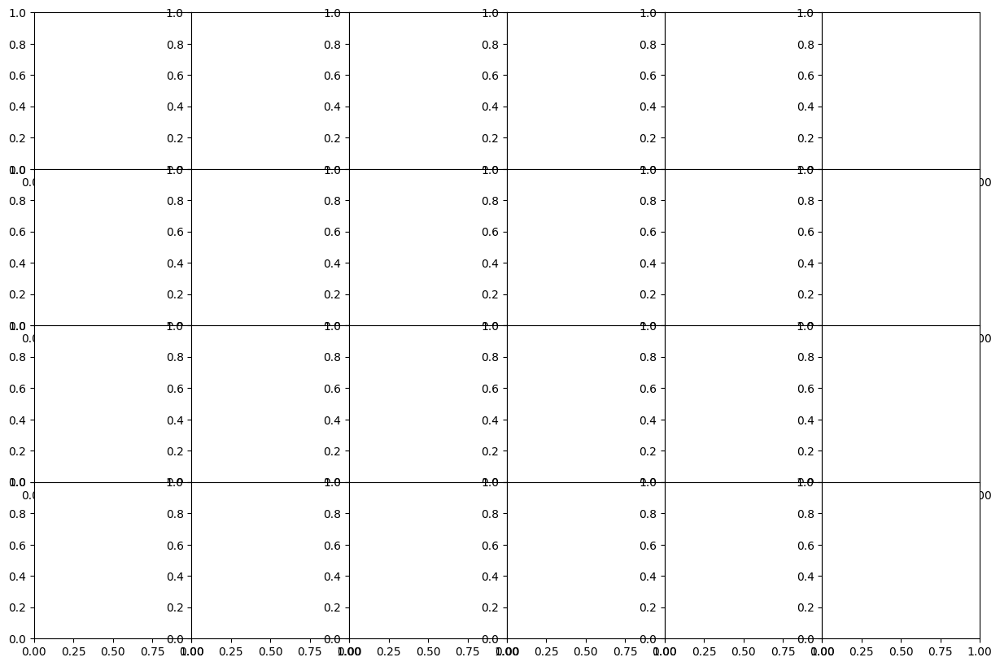

In [29]:
#assert option==1

fig, ax = plt.subplots(4,6,figsize=(15,10),sharex=False)
plt.subplots_adjust(wspace=0.0,hspace=0.0)
indices = [(0,0),(0,1),(0,2),(0,3),(0,4),(0,5),(1,0),(1,1),(1,2),(1,3),(1,4),(1,5),(2,0),(2,1),(2,2),(2,3),(2,4),(2,5),(3,0),(3,1),(3,2),(3,3),(3,4),(3,5)]

index = 0
for i,field in enumerate(Tl_unwindowed_all.keys()):
    
    ells_sum = np.product([base.parities[ff] for ff in field[:-1]])*int('%s'%field[-1]+'1')
    
    # Define weights and model
    l1s,l2s,l3s,l4s,Ls = np.asarray(tspec.get_ells(field=field[:-1]))
    weights = l1s*l2s*l3s*l4s*1e24
    xx = np.arange(len(tspec.sym_factor_all[i]))
    
    # Fisher Error
    fish_err = np.sqrt(np.diag(inv_fish)[index:index+len(tspec.sym_factor_all[i])])
    fish_err_ideal = np.sqrt(np.diag(inv_fish_ideal)[index:index+len(tspec.sym_factor_all[i])])
    if option!=2:
        fish_err_ideal *= np.sqrt(np.mean(mask**8.)/np.mean(mask**4)**2)
    index += len(tspec.sym_factor_all[i])
    
    # Plot spectra
    ax[indices[i]].errorbar(xx,weights*np.asarray(Tl_unwindowed4_all[field]).mean(axis=0),yerr=weights*fish_err,marker='.',ls='',
                           label='Unwindowed [4-field]',c='b',alpha=0.2)
    ax[indices[i]].errorbar(xx,weights*np.asarray(Tl_unwindowed_all[field]).mean(axis=0),yerr=weights*fish_err,marker='.',ls='',
                           label='Unwindowed',c='b',alpha=0.2)
    # ax[indices[i]].errorbar(xx,weights*np.asarray(Tl_ideal_all[field]).mean(axis=0),yerr=weights*fish_err_ideal,marker='.',ls='',
    #                         label='Ideal',c='g',alpha=0.2)
    ax[indices[i]].set_xticks([])
    if i>=18: ax[indices[i]].set_xlabel(r'Bin Index',fontsize=12)
    ax[indices[i]].set_title('%s'%field)
    if indices[i][1]==0:
        ax[indices[i]].set_ylabel(r'$\ell_1\ell_2\ell_3\ell_4\,t_{\ell_1\ell_2,\ell_3\ell_4}(L)\,\,[\mu K^4]$',fontsize=10)
    if i==4: ax[indices[i]].legend(fontsize=12,ncol=3)
    ax[indices[i]].set_xlim(min(xx),max(xx))
    
    vmax = np.percentile(weights*fish_err,80)
    ax[indices[i]].set_ylim(-vmax,vmax)
fig.savefig('Tl_validation.pdf',bbox_inches='tight')

In [ ]:
#assert option==2

fig, ax = plt.subplots(4,6,figsize=(15,10),sharex=False)
plt.subplots_adjust(wspace=0.0,hspace=0.0)

index = 0
for i,field in enumerate(Tl_unwindowed_all.keys()):
    
    # Define weights and model
    l1s,l2s,l3s,l4s,Ls = np.asarray(tspec.get_ells(field=field[:-1]))
    weights = l1s*l2s*l3s*l4s*1e24
    xx = np.arange(len(tspec.sym_factor_all[i]))
    
    # Fisher Error
    fish_err = np.sqrt(np.diag(inv_fish)[index:index+len(tspec.sym_factor_all[i])])
    fish_err_ideal = np.sqrt(np.diag(inv_fish_ideal)[index:index+len(tspec.sym_factor_all[i])])
    if option!=2:
        fish_err_ideal *= np.sqrt(np.mean(mask**8.)/np.mean(mask**4)**2)
    index += len(tspec.sym_factor_all[i])
    
    # Plot theory errors
    ax[indices[i]].errorbar(xx,weights*fish_err,ls='-',label='Unwindowed',c='b',alpha=0.3)
    ax[indices[i]].errorbar(xx,weights*fish_err_ideal,ls='-',label='Ideal',c='g',alpha=0.3)
    
    # Plot errors
    ax[indices[i]].errorbar(xx,weights*np.asarray(Tl_unwindowed4_all[field]).std(axis=0),marker='.',ls='',c='purple',alpha=0.3)
    ax[indices[i]].errorbar(xx,weights*np.asarray(Tl_unwindowed_all[field]).std(axis=0),marker='.',ls='',c='b',alpha=0.3)
    #ax[indices[i]].errorbar(xx,weights*np.asarray(Tl_ideal_all[field]).std(axis=0),marker='.',ls='',c='g',alpha=0.3)
    ax[indices[i]].set_xticks([])
    if i>=18: ax[indices[i]].set_xlabel(r'Bin Index',fontsize=12)
    ax[indices[i]].set_title('%s'%field)
    if indices[i][1]==0:
        ax[indices[i]].set_ylabel(r'$\ell_1\ell_2\ell_3\ell_4\,\sigma\left(t_{\ell_1\ell_2,\ell_3\ell_4}(L)\right)\,\,[\mu K^4]$',fontsize=10)
    if i==4: ax[indices[i]].legend(fontsize=12,ncol=3)
    ax[indices[i]].set_xlim(min(xx),max(xx))
    ax[indices[i]].set_ylim(min(weights*fish_err)*0.5,max(weights*fish_err)*2)
    ax[indices[i]].set_yscale('log')
    # #ax[indices[i]].set_ylim([1.5*min(pref_av*np.asarray(Cl_ideal_all[field]).mean(axis=0)),1.5*max(pref_av*np.asarray(Cl_ideal_all[field]).mean(axis=0))])
fig.savefig('Tl_validation_err.pdf',bbox_inches='tight')

In [30]:
# Plot Fisher matrices (real and ideal)

def plot_tri_correlation(matrix,matrix2=[],v=0.5,title='',remove_diagonal=True, outfile='',labs=[]):
    # Define correlation
    corr_matrix = matrix/np.sqrt(np.outer(np.diag(matrix),np.diag(matrix)))

    if len(matrix2)>0:
        corr_matrix2 = matrix2/np.sqrt(np.outer(np.diag(matrix2),np.diag(matrix2)))
        indices = np.triu_indices(len(corr_matrix))
        corr_matrix[indices] = corr_matrix2[indices]

    # Plot matrix
    fig, ax = plt.subplots(figsize=(10,10))
    pp = ax.imshow(corr_matrix-remove_diagonal*np.eye(len(corr_matrix)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
    ax.set_title(title)
    plt.colorbar(pp,fraction=0.04762, pad=0.0);
    i1 = 0
    for i in range(len(Tl_unwindowed_all.keys())):
        ax.hlines(i1-0.5,-0.5,len(matrix),linestyles=':',color='k',alpha=0.1)
        ax.vlines(i1-0.5,-0.5,len(matrix),linestyles=':',color='k',alpha=0.1)
        i1 += len(tspec.sym_factor_all[i])
    ax.hlines(len(matrix)//2-0.5,-0.5,len(matrix),linestyles='--',color='k',alpha=0.3)
    ax.vlines(len(matrix)//2-0.5,-0.5,len(matrix),linestyles='--',color='k',alpha=0.3)
    ax.set_xlim(-0.5,len(matrix)-0.5)
    ax.set_ylim(len(matrix)-0.5,-0.5)
    inds = np.asarray([len(tspec.sym_factor_all[i]) for i in range(len(tspec.sym_factor_all))])
    inds = inds/2+np.concatenate([[0],np.cumsum(inds)[:-1]])
    ax.set_xticks(inds)
    ax.set_xticklabels(list(Tl_ideal_all.keys()), rotation=90, family='monospace')
    ax.set_yticks(inds)
    ax.set_yticklabels(list(Tl_ideal_all.keys()), family='monospace')
    if len(labs)>0:
        plt.text(len(matrix)//16,len(matrix)*7//8,labs[0],c='purple')
        plt.text(len(matrix)*3//4,len(matrix)//16,labs[1],c='purple')    
    if len(outfile)>0:
        fig.savefig(outfile, bbox_inches='tight')

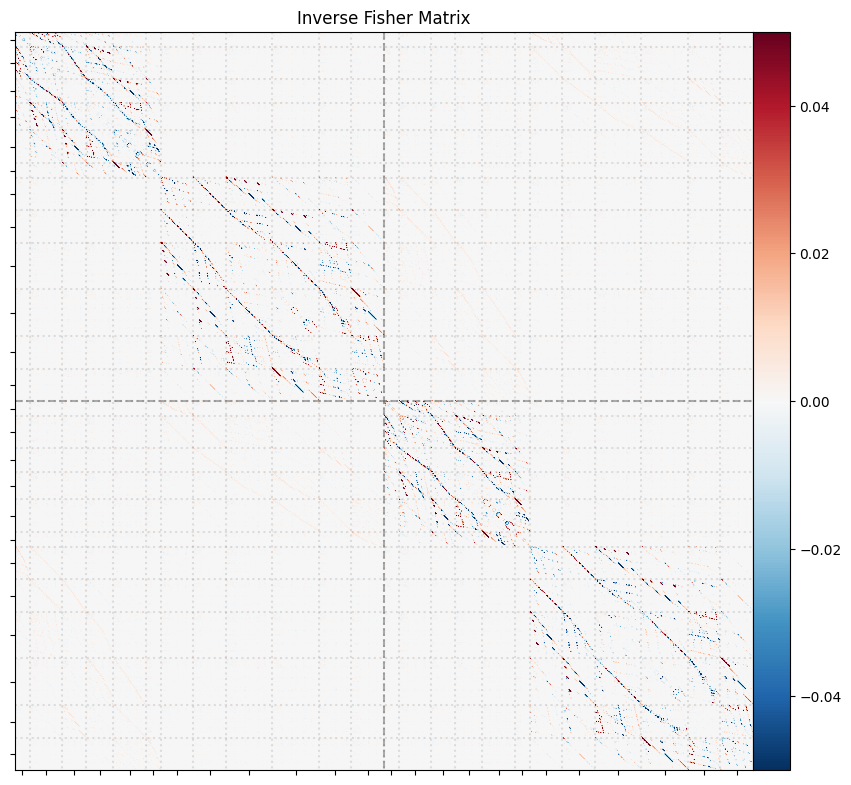

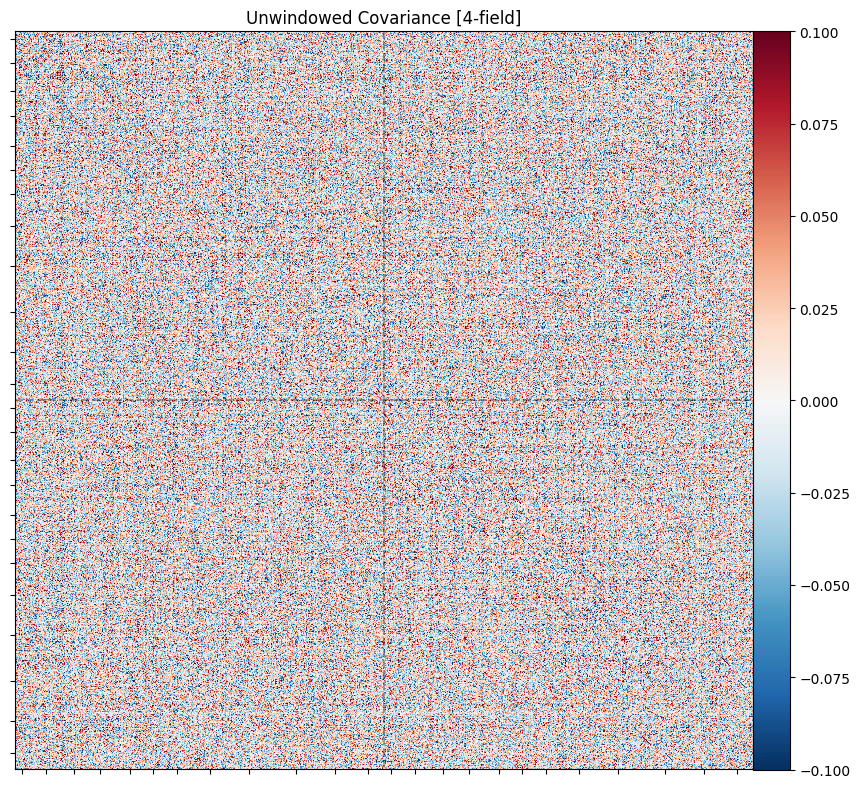

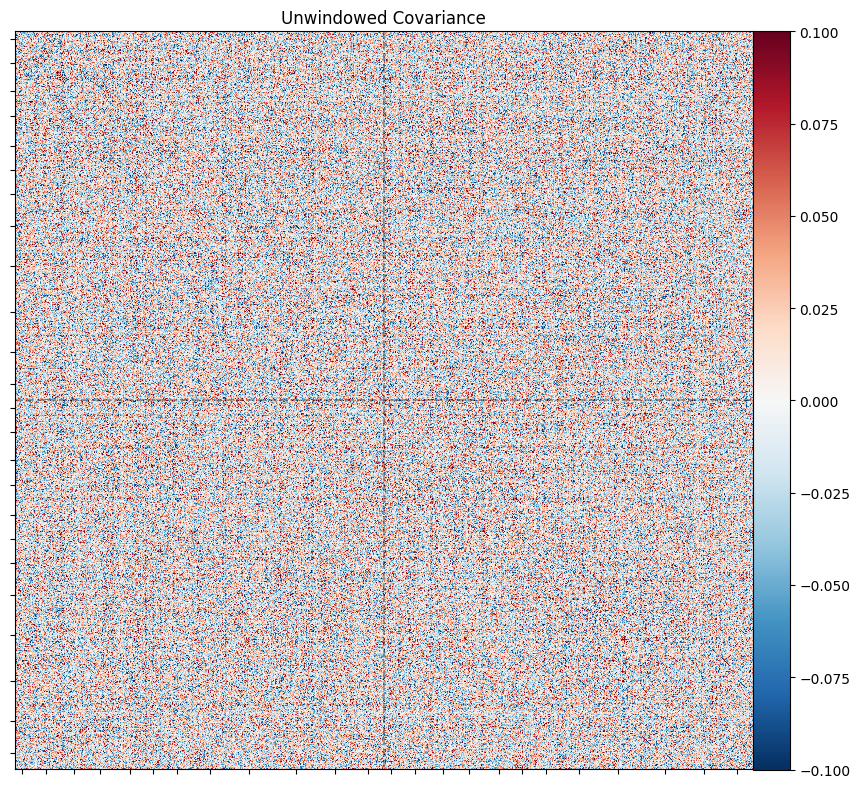

In [31]:
#assert option==2
plot_tri_correlation(inv_fish, v=0.05, title='Inverse Fisher Matrix', remove_diagonal=True,outfile='Tl_cov_fish.pdf')
plot_tri_correlation(unwindowed4_cov, v=0.1, title='Unwindowed Covariance [4-field]', remove_diagonal=True)#,outfile='Bl_cov_true.pdf')
plot_tri_correlation(unwindowed_cov, v=0.1, title='Unwindowed Covariance', remove_diagonal=True,outfile='Tl_cov_true.pdf')

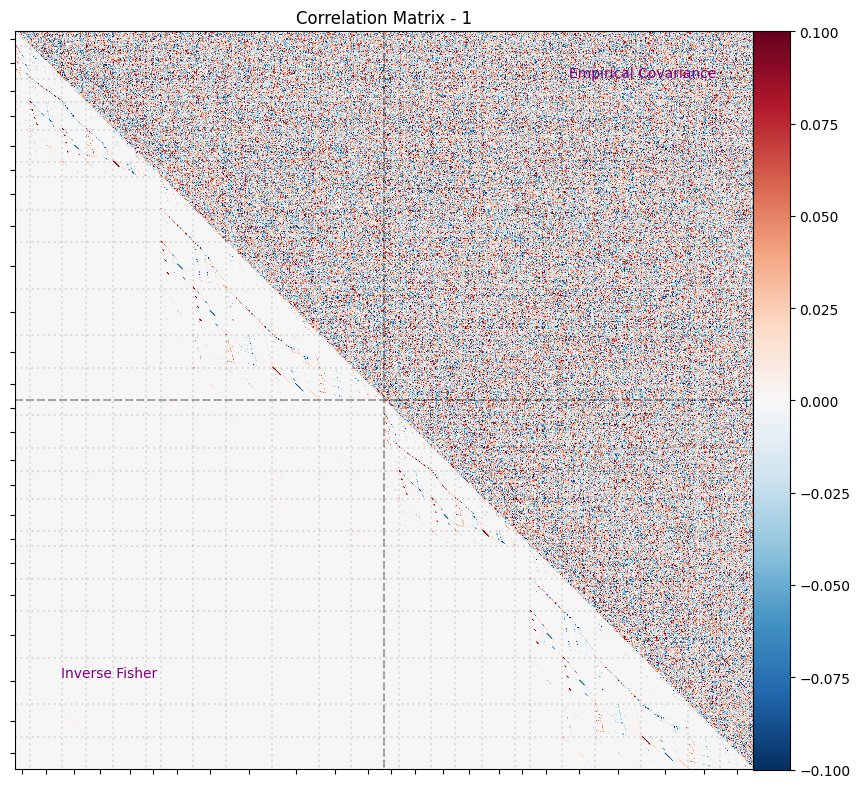

In [32]:
#assert option==2
plot_tri_correlation(inv_fish, unwindowed_cov, title='Correlation Matrix - 1',v=0.1,labs=['Inverse Fisher','Empirical Covariance'],outfile='Tl_cov_comparison.pdf')

## Theory prediction

\begin{eqnarray}
    t_0&=&\frac{\delta^{\rm K}_{\chi \,p_u,1}}{\Delta_4^u(\vec b)}\sum_{L}\Theta_L(B)\Theta_{\ell_1}(b_1)\Theta_{\ell_2}(b_2)\tj{\ell_1}{\ell_2}{L}{-1}{-1}{2}^2\frac{(2\ell_1+1)(2\ell_2+1)(2L+1)}{4\pi}\nonumber\\
    &&\,\times\,(-1)^{\ell_1+\ell_2+L}\bigg(\delta^{\rm K}_{b_1b_3}\delta^{\rm K}_{b_2b_4}\mathbb{C}^{-1,u_1u_3}_{\ell_1}\mathbb{C}^{-1,u_2u_4}_{\ell_2}+\delta^{\rm K}_{b_1b_4}\delta^{\rm K}_{b_2b_3}\mathbb{C}^{-1,u_1u_4}_{\ell_1}\mathbb{C}^{-1,u_2u_3}_{\ell_2}\bigg),
\end{eqnarray}

In [19]:
self = tspec
verb = True

# Compute symmetry factor, if not already present
if not hasattr(self, 'sym_factor'):
    self._compute_symmetry_factor()

# Transform to harmonic space and normalize data by 1/C_th
Cinv_data_lm = np.einsum('ijk,jk->ik',self.base.inv_Cl_lm_mat,self.base.to_lm(data),order='C')

def compute_t0_contribution(input_index):
    
    # Define 4-, 2- and 0-field arrays
    t0_num_ideal = np.zeros(self.N_t)

    # Iterate over fields
    index = 0
    for u in self.fields:
        u1, u2, u3, u4 = [self.base.indices[u[i]] for i in range(4)]
        p_u = np.product([self.base.parities[u[i]] for i in range(4)])
        
        # Iterate over bins satisfying relevant conditions
        for bin1 in range(self.Nl):
            for bin2 in range(self.Nl_squeeze):
                if u1==u2 and bin2<bin1: continue
                for bin3 in range(self.Nl):
                    if u1==u3 and u2==u4 and bin3<bin1: continue
                    for bin4 in range(self.Nl_squeeze):
                        if u3==u4 and bin4<bin3: continue
                        if u1==u3 and u2==u4 and bin1==bin3 and bin4<bin2: continue

                        # Iterate over L bins
                        for binL in range(self.NL):
                            # skip bins outside the triangle conditions
                            if not self._check_bin(bin1,bin2,binL): continue
                            if not self._check_bin(bin3,bin4,binL): continue
                            
                            if index!=input_index:
                                index += 1
                                continue

                            # Check if two external bins are equal (if not, no contribution to 2- and 0-field terms)
                            if ((bin1==bin3)*(bin2==bin4)+(bin1==bin4)*(bin2==bin3))==0:
                                index += 1
                                continue
                            # Check if we contribute to the correct parity (we need chi*p_u=1 here!)
                            if p_u==-1 and self.parity=='even': 
                                index += 1
                                continue
                            if p_u==1 and self.parity=='odd':
                                index += 1
                                continue

                            # Sum over ells for two- and zero-point terms
                            value0 = 0.
                            for l1 in range(self.l_bins[bin1],self.l_bins[bin1+1]):

                                for l2 in range(self.l_bins_squeeze[bin2],self.l_bins_squeeze[bin2+1]):

                                    for L in range(max(self.L_bins[binL],abs(l1-l2)),min(self.L_bins[binL+1],l1+l2)):

                                        # define 3j symbols with spin (-1, -1, 2)
                                        tjs = self.threej(l1,l2,L)**2.
                                        if tjs==0: continue
                                        pref = (2*L+1.)*(2*l1+1.)*(2*l2+1.)/(4.*np.pi)*tjs*(-1.)**(l1+l2+L)

                                        # First permutation
                                        if (bin1==bin3)*(bin2==bin4):
                                            value0 += pref*self.base.inv_Cl_mat[u3,u1][l1]*self.base.inv_Cl_mat[u4,u2][l2]*self.beam[u1][l1]*self.beam[u3][l1]*self.beam[u2][l2]*self.beam[u4][l2]

                                        # Second permutation
                                        if (bin1==bin4)*(bin2==bin3):                                                    
                                            value0 += pref*self.base.inv_Cl_mat[u4,u1][l1]*self.base.inv_Cl_mat[u3,u2][l2]*self.beam[u1][l1]*self.beam[u4][l1]*self.beam[u3][l2]*self.beam[u2][l2]*(bin1==bin4)*(bin2==bin3)

                            # Add to output arrays, depending on parity
                            chi_index = 0
                            for chi in self.chi_arr:
                                if p_u*chi==-1: 
                                    chi_index += 1
                                    continue
                                t0_num_ideal[chi_index*self.N_t//2+index] = value0
                                chi_index += 1
                            index += 1

    t0_num = t0_num_ideal/self.sym_factor
    return t0_num[input_index]

## can we multiprocess $t0$ and $t2$ contribution usually??

In [17]:
import multiprocessing as mp, tqdm
p = mp.Pool(4)
#t0_num = list(tqdm.tqdm(p.imap_unordered(compute_t0_contribution, np.arange(len(tspec.sym_factor))),total=len(tspec.sym_factor)))
t0_num = list(tqdm.tqdm(p.imap_unordered(compute_t0_contribution, np.arange(len(tspec.sym_factor[:30]))),total=len(tspec.sym_factor[:30])))
t0_num = np.asarray(t0_num)

100%|██████████| 30/30 [00:48<00:00,  1.63s/it]


In [20]:
t0_num

array([ 0.00000000e+00,  1.52530973e+19,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -4.85893629e+23,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -2.16572839e+25,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -1.12005627e+27,
        7.06760414e+23,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  2.75348461e+25,  1.81385261e+27, -5.14905457e+28,
        4.29305825e+28, -6.57574983e+30])

In [235]:
compute_t0_contribution(42)

0.0

### did we mess up $\chi p_u$ factor??

In [226]:
t0_num_ideal

array([1.25292613e+20, 0.00000000e+00, 0.00000000e+00, ...,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00])

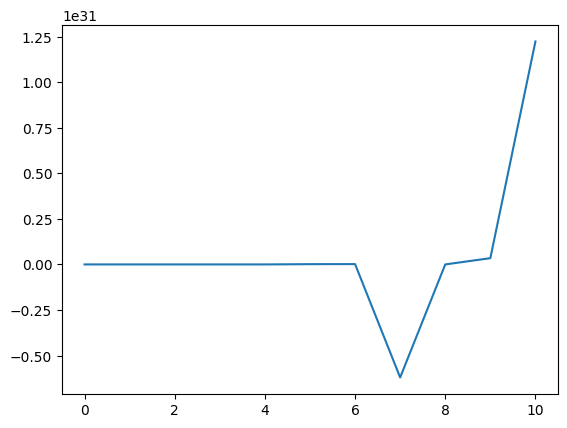

In [227]:
plt.plot(t0_num_ideal[t0_num_ideal!=0])

16
22
16
28
22
16
22
22
34
34
22
22


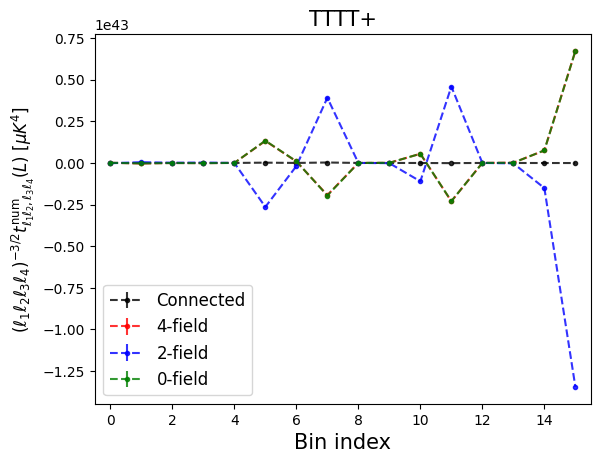

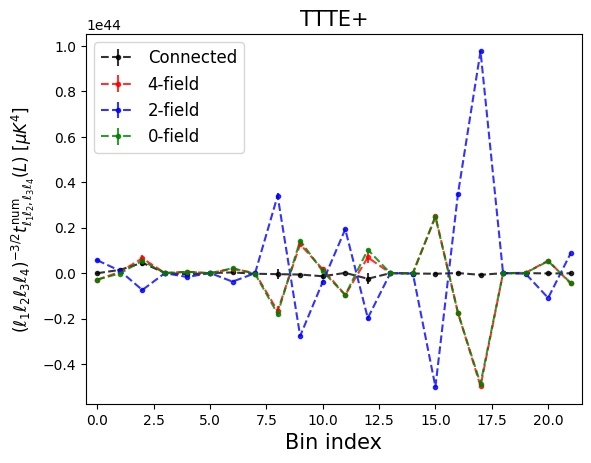

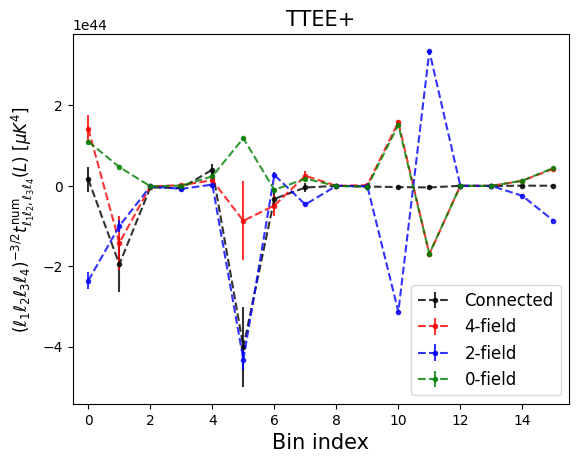

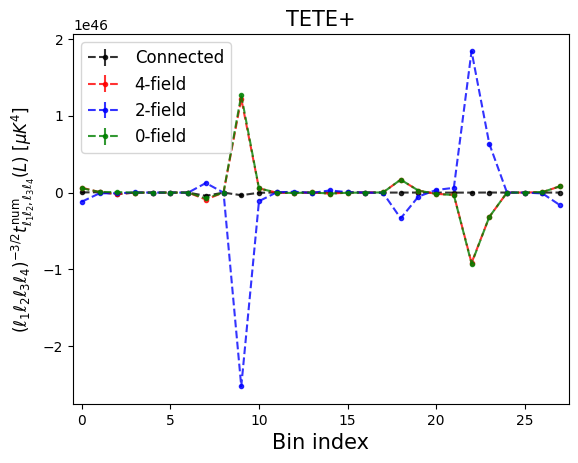

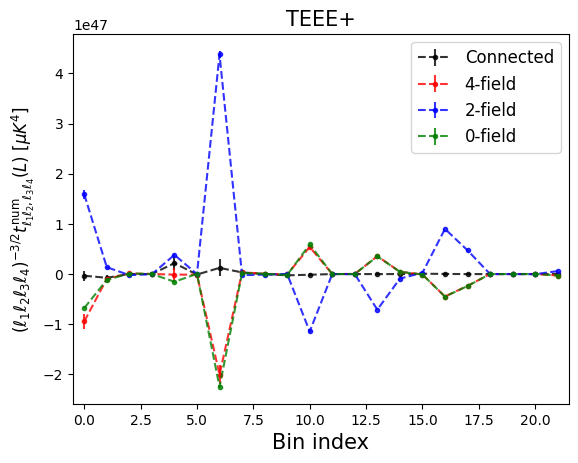

...

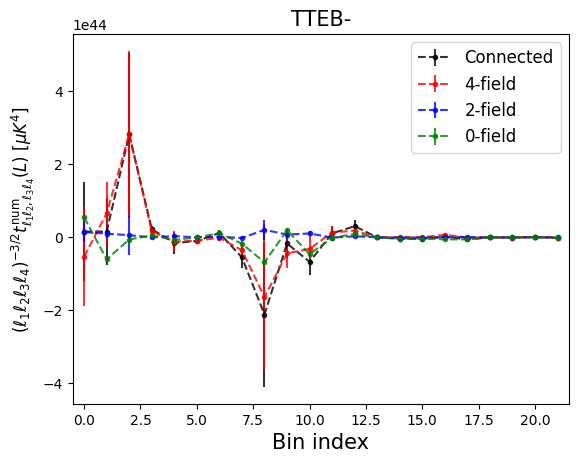

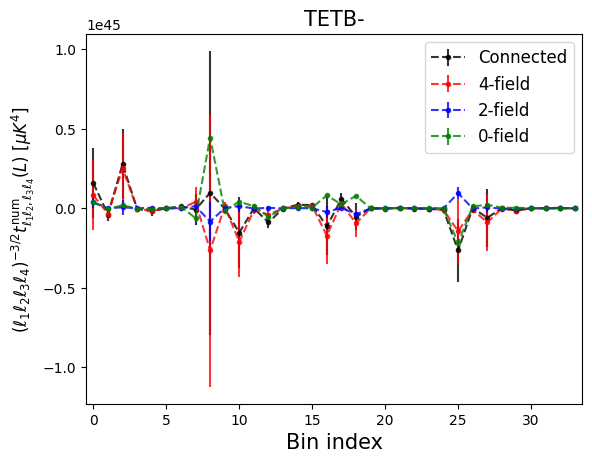

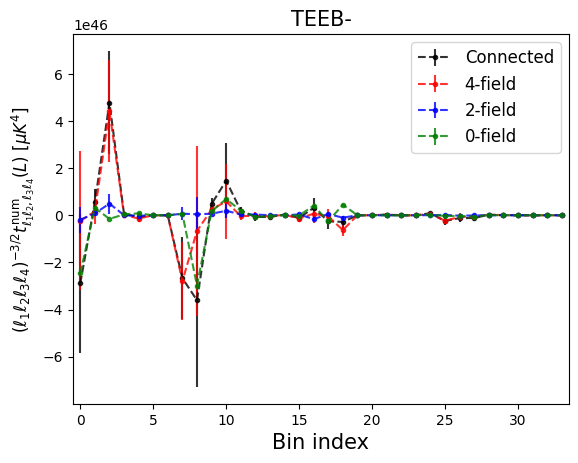

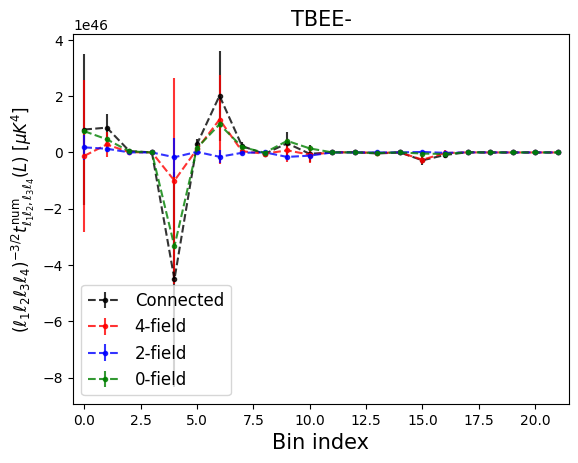

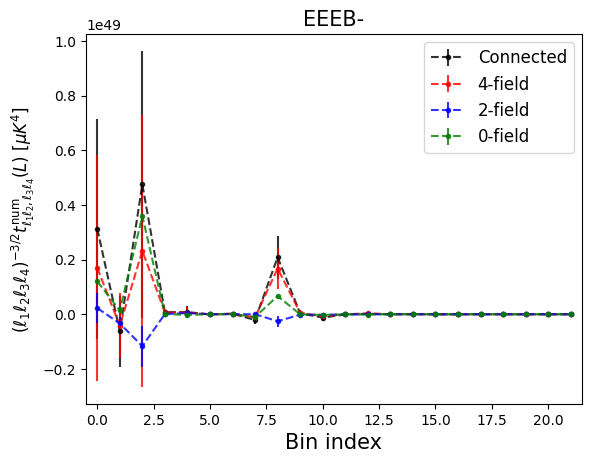

In [218]:
index = 0
assert option==2
for i,f in enumerate(Tl_unwindowed_all.keys()):
    
    ct = 0
    for j in range(4):
        if f[j]=='B': ct += 1
    if ct%2==1: pu=-1
    else: pu = 1
    if f[-1]=='-' and pu==1: continue
    if f[-1]=='+' and pu==-1: continue

    #if i>2: break
    N_grf = len(Tl_unwindowed_all[f])
    
    # Define weights and model
    l1s,l2s,l3s,l4s,Ls = np.asarray(tspec.get_ells(field=f[:-1]))
    weights = 1e24*(1.+0.*l1s)/(l1s*l2s*l3s*l4s)**1.5
    
    # Define indices
    ind = np.arange(index,index+len(tspec.sym_factor_all[i]))
    filt = ((l1s==l3s)*(l2s==l4s))+((l1s==l4s)*(l2s==l3s))
    print(np.sum(filt))
    #ind = ind[(l1s==l2s)&(l2s==l3s)&(l3s==l4s)]
    weights = weights[filt]
    ind = ind[filt]
    
    plt.figure()
    x_arr = np.arange(len(ind))
    # Theoretical expectations (only valid without a mask)
    # if np.abs(np.mean(mask)-1.)<1e-4:
    #     plt.plot(x_arr,weights*Tl_unwindowed_all[ind]/tspec.sym_factor[ind],c='r',alpha=0.5)
    #     plt.plot(x_arr,weights*-2*tspec.t0_num_ideal[ind]/tspec.sym_factor[ind],c='b',alpha=0.5)
    #     plt.plot(x_arr,weights*tspec.t0_num_ideal[ind]/tspec.sym_factor[ind],c='g',alpha=0.5)
    #     plt.plot(x_arr,weights*0.,c='k',alpha=0.5)
    # Data
    plt.errorbar(x_arr,weights*np.mean(unwindowed_num,axis=0)[ind],yerr=weights*np.std(unwindowed_num,axis=0)[ind]/np.sqrt(N_grf),
                 marker='.',ls='--',label='Connected',c='k',alpha=0.8)
    plt.errorbar(x_arr,weights*np.mean(unwindowed4_num,axis=0)[ind],yerr=weights*np.std(unwindowed4_num,axis=0)[ind]/np.sqrt(N_grf),
                 marker='.',ls='--',label='4-field',c='r',alpha=0.8)
    plt.errorbar(x_arr,weights*np.mean(unwindowed_num-unwindowed4_num-unwindowed0_num,axis=0)[ind],yerr=weights*np.std(unwindowed_num-unwindowed4_num-unwindowed0_num,axis=0)[ind]/np.sqrt(N_grf),
                 marker='.',ls='--',label='2-field',c='b',alpha=0.8)
    plt.errorbar(x_arr,weights*np.mean(unwindowed0_num,axis=0)[ind],yerr=weights*np.std(unwindowed0_num,axis=0)[ind]/np.sqrt(N_grf),
                 marker='.',ls='--',label='0-field',c='g',alpha=0.8)
#     plt.errorbar(x_arr,weights*np.mean(Tl_unwindowed4_all[f],axis=0),yerr=weights*np.std(Tl_unwindowed_all[f],axis=0)/np.sqrt(N_grf),
#                  marker='.',ls='',label='4-field',c='r',alpha=0.8)
#     plt.errorbar(x_arr,weights*np.mean(Tl_unwindowed_all[f]-Tl_unwindowed4_all[f]-Tl_unwindowed0_all[f],axis=0),yerr=weights*np.std(Tl_unwindowed_all[f]-Tl_unwindowed4_all[f]-Tl_unwindowed0_all[f],axis=0)/np.sqrt(N_grf),
#                  marker='.',ls='',label='2-field',c='b',alpha=0.8)
#     plt.errorbar(x_arr,weights*np.mean(Tl_unwindowed0_all[f],axis=0),yerr=weights*np.std(Tl_unwindowed_all[f],axis=0)/np.sqrt(N_grf),
#                  marker='.',ls='',label='0-field',c='g',alpha=0.8)
    
    #plt.errorbar(x_arr,weights*np.mean(t4_num,axis=0)[ind],yerr=weights*np.std(t4_num,axis=0)[ind]/np.sqrt(N_grf),marker='.',ls='',label='4-field',c='r',alpha=0.8)
    #plt.errorbar(x_arr,weights*np.mean(t2_num,axis=0)[ind],yerr=weights*np.std(t4_num,axis=0)[ind]/np.sqrt(N_grf),marker='.',ls='',label='2-field',c='b',alpha=0.8)
    #plt.errorbar(x_arr,weights*np.mean(t0_num,axis=0)[ind],yerr=weights*np.std(t4_num,axis=0)[ind]/np.sqrt(N_grf),marker='.',ls='',label='0-field',c='g',alpha=0.8)
    plt.xlim([-0.5,len(x_arr)-0.5])
    plt.xlabel(r'Bin index',fontsize=15)
    plt.ylabel(r'$(\ell_1\ell_2\ell_3\ell_4)^{-3/2}t^{\mathrm{num}}_{\ell_1\ell_2,\ell_3\ell_4}(L)\,\,[\mu K^4]$',fontsize=12)
    plt.legend(fontsize=12)
    plt.title('%s'%f, fontsize=15)
   
    
    index += len(tspec.sym_factor_all[i])

# OLD

## Test new vs old code

In [ ]:
Tl_opts = []
Tl_opts_no02 = []
Tl_ideals = []

for o,optionF in enumerate([1,2]):

    inv_fish_opt = np.linalg.inv(fishs[o])
    inv_fish_ideal = np.linalg.inv(fish_ideal)

    Tl_opt, Tl_opt_no02, Tl_ideal = [],[],[]
    ct = 0
    for i in range(N_sim):
        try:
            d1 = np.load('/projects/QUIJOTE/Oliver/polybin_testing/tnum%d_opt%d.npy'%(optionF,i),allow_pickle=True)
            d2 = np.load('/projects/QUIJOTE/Oliver/polybin_testing/tnum%d_opt%d_no02.npy'%(optionF,i),allow_pickle=True)
            d3 = np.load('/projects/QUIJOTE/Oliver/polybin_testing/tnum%d_ideal%d.npy'%(optionF,i),allow_pickle=True)
            ct += 1
        except IOError:
            continue
        Tl_opt.append(inv_fish_opt@np.concatenate(d1))
        Tl_opt_no02.append(inv_fish_opt@np.concatenate(d2))
        Tl_ideal.append(inv_fish_ideal@np.concatenate(d3)[edge_filt])
        
    Tl_opts.append(Tl_opt)
    Tl_opts_no02.append(Tl_opt_no02)
    Tl_ideals.append(Tl_ideal)
    print("Using %d simulations"%ct)

In [47]:
d1a = np.load('/projects/QUIJOTE/Oliver/polybin_testing/test_tfish1_0.npy',allow_pickle=True)
d1b = np.load('/projects/QUIJOTE/Oliver/polybin_testing/tfish1_0.npy',allow_pickle=True)

d2a = np.load('/projects/QUIJOTE/Oliver/polybin_testing/test_tnum1_opt0.npy',allow_pickle=True)
d2b = np.load('/projects/QUIJOTE/Oliver/polybin_testing/tnum1_opt0.npy',allow_pickle=True)

d3a = np.load('/projects/QUIJOTE/Oliver/polybin_testing/test_tnum1_opt0_no02.npy',allow_pickle=True)
d3b = np.load('/projects/QUIJOTE/Oliver/polybin_testing/tnum1_opt0_no02.npy',allow_pickle=True)

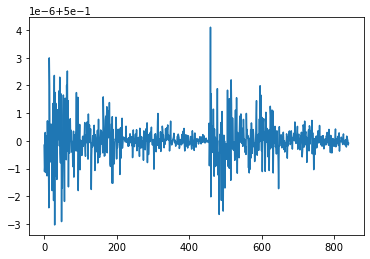

In [48]:
plt.plot(np.diag(d1a)/np.diag(d1b))

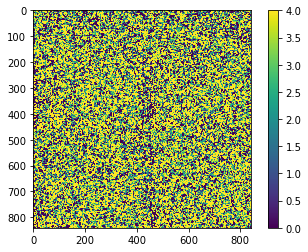

In [49]:
plt.imshow((d1b+d1b.T)/d1a,vmin=0,vmax=4);plt.colorbar();

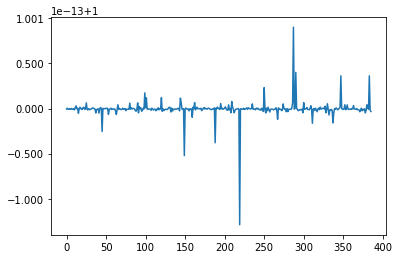

In [50]:
#plt.plot(np.diag(d1))
#plt.plot(np.diag(d2))
#plt.plot(np.diag(d1a)/np.diag(d1b))
plt.plot(d3a[1]/d3b[1])

### Imports

In [2]:
%pylab inline
import sys
sys.path.append('../')
import polybin as pb
import healpy
from scipy.interpolate import InterpolatedUnivariateSpline

Populating the interactive namespace from numpy and matplotlib


In [3]:
import importlib
importlib.reload(pb);

### Options

In [4]:
# HEALPix settings
Nside = 128
lmax = 3*Nside-1

# Binning parameters
dl = 20 # width
Nl = 6 # number
min_l = 2 # minimum
print("binned lmax: %d"%(min_l+dl*Nl))

# Number of random iterations to create Fisher matrix
N_it = 100

# Number of simulations to use for testing
N_sim = 1000

# Whether to include bins only partially satisfying triangle conditions
include_partial_triangles = False

# whether to add a separable reduced bispectrum to the input maps
option=2

if option==1:
    include_mask = False
else:
    include_mask = True

include_synthetic_b = False
b_input_fac = lambda l1: np.exp(-(l1-2)/40.)*2e-6

# Galactic Mask
# Using GAL040 mask with 2-degree apodization for testing
root = '/projects/QUIJOTE/Oliver/planck/'
maskfile = 'HFI_Mask_GalPlane-apo2_2048_R2.00.fits'

binned lmax: 122


### Fiducial Power and Noise Spectrum

In [5]:
from classy import Class
cosmo = Class()

# Define ell arrays
l = np.arange(lmax+1)

# Run CLASS
cosmo.set({'output':'tCl,lCl,mPk','l_max_scalars':lmax+1,'lensing':'yes',
           'omega_b':0.022383,
           'non linear':'no',
           'omega_cdm':0.12011,
           'h':0.6732,
           'm_ncdm':0.06,
           'N_ncdm':1,
           'tau_reio':0.0543,
           'A_s':1e-10*np.exp(3.0448),
           'n_s':0.96605});
cosmo.compute()

# Compute signal C_ell
Cl_dict = cosmo.lensed_cl(lmax);
Cl_th = Cl_dict['tt']*cosmo.T_cmb()**2

# Compute noise C_ell
DeltaT = 60./60.*np.pi/180.*1e-6 # in K-radians
thetaFWHM = 5./60.*np.pi/180. # in radians
Nl_th = DeltaT**2*np.exp(l*(l+1)*thetaFWHM**2/(8.*np.log(2)))*(l>2)

### Load mask

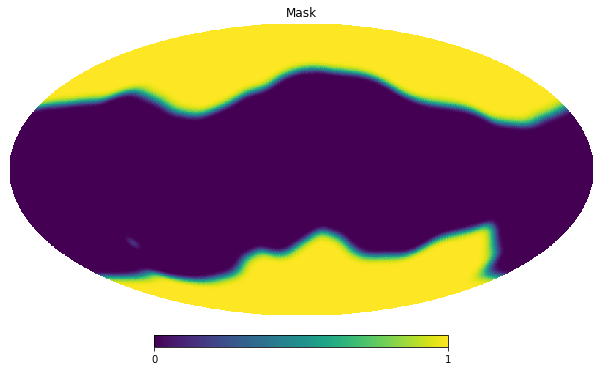

In [6]:
mask = healpy.ud_grade(healpy.read_map(root+maskfile,field=1),Nside)
if not include_mask:
    mask = 1.+0.*mask
healpy.mollview(mask,title='Mask')

### Initialize PolyBin class

In [7]:
# Load class with fiducial Cl and Nside
base = pb.PolyBin(Nside, Cl_th+Nl_th+(l<2)*Cl_th[2])

### Generate Synthetic Data with known $C_\ell$

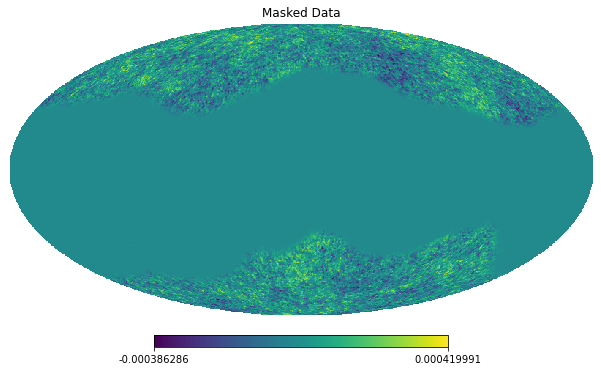

In [8]:
# Generate unmasked data with known C_l and factorized b
# Cl is set to the fiducial spectrum unless otherwise specified
# No beam is included
raw_data = base.generate_data(seed=42, add_B=include_synthetic_b, b_input=b_input_fac)

# Mask the map
data = raw_data*mask

# Plot the data
healpy.mollview(data,title='Masked Data')

### Define weighting function (user-set)
- A simple option would be ```applySinv=base.applyUinv```, which matches the code below.
- The idealized estimators just use a $C_{\rm fid}^{-1}$ weighting (which should include noise).

In [9]:
def applySinv(input_map):
    """Apply the optimal weighting to a map. 
    
    Here, we assume that the forward covariance is diagonal, in particular C_l, and invert this.
    This is not quite the exact solution (as it incorrectly treats W(n) factors), but should be unbiased."""
    
    # Transform to harmonic space
    input_map_lm = base.to_lm(input_map)
    # Divide by covariance and return to map-space
    Cinv_map = base.to_map(base.safe_divide(input_map_lm,base.Cl_lm))
    
    return Cinv_map

# Trispectrum estimation

In [10]:
importlib.reload(pb)
base = pb.PolyBin(Nside,Cl_th+Nl_th+(l<2)*Cl_th[2])

In [11]:
# Initialize trispectrum class
tspec = pb.TSpec(base, mask, applySinv, min_l, dl, Nl)
tspec._compute_even_symmetry_factor()
tspec._compute_odd_symmetry_factor()

TypeError: object of type 'int' has no len()

In [12]:
edge_filt = []
for bin1 in range(Nl):
    for bin2 in range(bin1,Nl):
        for bin3 in range(bin1,Nl):
            for bin4 in range(bin3,Nl):
                # always include all bins here for counting!
                if bin1==bin3 and bin4<bin2: continue
                for binL in range(Nl):
                    # skip bins outside the triangle conditions
                    if not tspec._check_bin(bin1,bin2,binL,even=False): continue
                    if not tspec._check_bin(bin3,bin4,binL,even=False): continue
                    if bin1!=Nl-1 and bin2!=Nl-1 and bin3!=Nl-1 and bin4!=Nl-1 and binL!=Nl-1:
                        edge_filt.append(True)
                    else:
                        edge_filt.append(False)
i_odd = np.sum(edge_filt)
for bin1 in range(Nl):
    for bin2 in range(bin1,Nl):
        for bin3 in range(bin1,Nl):
            for bin4 in range(bin3,Nl):
                # always include all bins here for counting!
                if bin1==bin3 and bin4<bin2: continue
                for binL in range(Nl):
                    # skip bins outside the triangle conditions
                    if not tspec._check_bin(bin1,bin2,binL,even=False): continue
                    if not tspec._check_bin(bin3,bin4,binL,even=False): continue
                    if bin1==bin3 and bin4==bin2: continue
                    if bin1!=Nl-1 and bin2!=Nl-1 and bin3!=Nl-1 and bin4!=Nl-1 and binL!=Nl-1:
                        edge_filt.append(True)
                    else:
                        edge_filt.append(False)

NameError: name 'tspec' is not defined

In [13]:
weights = []
for bin1 in range(Nl):
    for bin2 in range(bin1,Nl):
        for bin3 in range(bin1,Nl):
            for bin4 in range(bin3,Nl):
                # always include all bins here for counting!
                if bin1==bin3 and bin4<bin2: continue
                for binL in range(Nl):
                    # skip bins outside the triangle conditions
                    if not tspec._check_bin(bin1,bin2,binL,even=False): continue
                    if not tspec._check_bin(bin3,bin4,binL,even=False): continue
                    weights.append((min_l+(bin1+0.5)*dl)*(min_l+(bin2+0.5)*dl)*(min_l+(bin3+0.5)*dl)*(min_l+(bin4+0.5)*dl)*1e24)
for bin1 in range(Nl):
    for bin2 in range(bin1,Nl):
        for bin3 in range(bin1,Nl):
            for bin4 in range(bin3,Nl):
                # always include all bins here for counting!
                if bin1==bin3 and bin4<=bin2: continue
                for binL in range(Nl):
                    # skip bins outside the triangle conditions
                    if not tspec._check_bin(bin1,bin2,binL,even=False): continue
                    if not tspec._check_bin(bin3,bin4,binL,even=False): continue
                    weights.append((min_l+(bin1+0.5)*dl)*(min_l+(bin2+0.5)*dl)*(min_l+(bin3+0.5)*dl)*(min_l+(bin4+0.5)*dl)*1e24)
weights = np.asarray(weights)

### Load Fisher matrices

#### note lower lmax here!!

In [52]:
from scipy.linalg import block_diag

fish_ideal = block_diag(*np.load('/projects/QUIJOTE/Oliver/polybin_testing/tfish_ideal_2_20_5.npy',allow_pickle=True))

In [53]:
N_it = 10

In [55]:
### Load external Fisher matrices

fishs = []
fish_ideals = []

for optionF in [1,2]:
    
    fish = 0.
    ct = 0
    for i in range(N_it):
        try:
            fish += np.load('/projects/QUIJOTE/Oliver/polybin_testing/tfish%d_%d.npy'%(optionF,i))
            ct += 1
        except IOError:
            pass
    fish /= ct
    print("Using %d simulations"%ct)
    fishs.append(0.5*(fish+fish.T))
    
    # Initialize bispectrum class
#     if option==1:
#         this_tspec = pb.TSpec(base, 1.+0.*mask, applySinv, min_l, dl, Nl)
#     else:
#         this_tspec = pb.TSpec(base, mask, applySinv, min_l, dl, Nl)

Using 10 simulations
Using 10 simulations


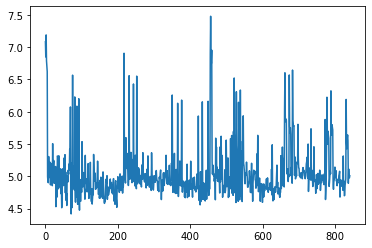

In [35]:
plt.plot(np.diag(fishs[0])/np.diag(fishs[1]))

In [51]:
Tl_opts = []
Tl_opts_no02 = []
Tl_ideals = []

for o,optionF in enumerate([1,2]):

    inv_fish_opt = np.linalg.inv(fishs[o])
    inv_fish_ideal = np.linalg.inv(fish_ideal)

    Tl_opt, Tl_opt_no02, Tl_ideal = [],[],[]
    ct = 0
    for i in range(N_sim):
        try:
            d1 = np.load('/projects/QUIJOTE/Oliver/polybin_testing/tnum%d_opt%d.npy'%(optionF,i),allow_pickle=True)
            d2 = np.load('/projects/QUIJOTE/Oliver/polybin_testing/tnum%d_opt%d_no02.npy'%(optionF,i),allow_pickle=True)
            d3 = np.load('/projects/QUIJOTE/Oliver/polybin_testing/tnum%d_ideal%d.npy'%(optionF,i),allow_pickle=True)
            ct += 1
        except IOError:
            continue
        Tl_opt.append(inv_fish_opt@np.concatenate(d1))
        Tl_opt_no02.append(inv_fish_opt@np.concatenate(d2))
        Tl_ideal.append(inv_fish_ideal@np.concatenate(d3)[edge_filt])
        
    Tl_opts.append(Tl_opt)
    Tl_opts_no02.append(Tl_opt_no02)
    Tl_ideals.append(Tl_ideal)
    print("Using %d simulations"%ct)

NameError: name 'fishs' is not defined

In [37]:
Tl_opts10 = Tl_opts.copy()

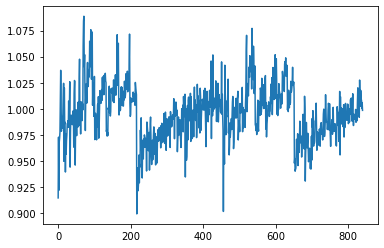

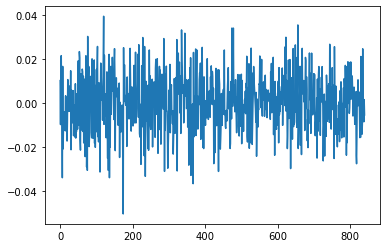

In [39]:
plt.plot(np.asarray(Tl_opts100[1]).std(axis=0)/np.asarray(Tl_opts10[1]).std(axis=0))
plt.figure()
plt.plot((np.asarray(Tl_opts100[1])-np.asarray(Tl_opts10[1])).mean(axis=0)/np.asarray(Tl_opts100[1]).std(axis=0))

### T0 theory

Ideal:\begin{eqnarray}
    \widehat{t}_0(\vec b,L) &\propto& \frac{1}{\Delta_4(\vec b)}\sum_{\ell_1\ell_2m_2}\frac{(2\ell_1+1)(2\ell_2+1)(2L+1)}{4\pi}\begin{pmatrix}\ell_1 & \ell_2 & L\\ -1 & -1 & 2\end{pmatrix}^2\\\nonumber
    &&\,\times\,(-1)^{\ell_1+\ell_2+L}C_{\ell_1}^{-1}C_{\ell_2}^{-1}\left(\delta_{b_1b_3}^{\rm K}\delta_{b_2b_4}^{\rm K}+\delta_{b_1b_4}^{\rm K}\delta_{b_2b_3}^{\rm K}\right).
\end{eqnarray}

In [18]:
t0_num_analyt = []
ii = 0
for bin1 in range(Nl):
    for bin2 in range(bin1,Nl):
        for bin3 in range(bin1,Nl):
            for bin4 in range(bin3,Nl):
                if bin1==bin3 and bin4<bin2: continue
                for binL in range(Nl):
                    if not tspec._check_bin(bin1,bin2,binL): continue
                    if not tspec._check_bin(bin3,bin4,binL): continue

                    kroneckers = (bin1==bin3)*(bin2==bin4)+(bin1==bin4)*(bin2==bin3)
                    if kroneckers==0: 
                        ii += 1
                        t0_num_analyt.append(0.)
                        continue
                        
                    value = 0.
                        
                    # Sum over ells for zero-point terms
                    for l1 in range(min_l+bin1*dl,min_l+(bin1+1)*dl):
                        for l2 in range(min_l+bin2*dl,min_l+(bin2+1)*dl):
                            for L in range(min_l+binL*dl,min_l+(binL+1)*dl):
                                if L<abs(l1-l2) or L>l1+l2: continue
                                pref = (2*l1+1.)*(2*l2+1.)*(2*L+1.)/(4*np.pi)*tspec.threej(l1,l2,L)**2*(-1.)**(l1+l2+L)
                                value += pref/tspec.base.Cl[l1]/tspec.base.Cl[l2]*kroneckers
                    t0_num_analyt.append(value/tspec.sym_factor_even[ii])
                    ii += 1
for _ in range(tspec.N_t_odd):
    t0_num_analyt.append(0.)

## Plot with disconnected pieces

In [19]:
tspec.generate_sims(10)

Using 10 pairs of Monte Carlo simulations


In [20]:
tspec._compute_t0_numerator(parity='both')

### Define terms that should contain disconnected pieces (if ideal)

In [21]:
disc_filt = []
# Even
for bin1 in range(Nl):
    for bin2 in range(bin1,Nl):
        for bin3 in range(bin1,Nl):
            for bin4 in range(bin3,Nl):
                if bin1==bin3 and bin4<bin2: continue
                for binL in range(Nl):
                    if not tspec._check_bin(bin1,bin2,binL): continue
                    if not tspec._check_bin(bin3,bin4,binL): continue
                    if ((bin1==bin3)*(bin2==bin4)+(bin1==bin4)*(bin2==bin3))!=0:
                        disc_filt.append(True)
                    else:
                        disc_filt.append(False)
# Odd (no contributions)
for bin1 in range(Nl):
    for bin2 in range(bin1,Nl):
        for bin3 in range(bin1,Nl):
            for bin4 in range(bin3,Nl):
                if bin1==bin3 and bin4<=bin2: continue
                for binL in range(Nl):
                    if not tspec._check_bin(bin1,bin2,binL): continue
                    if not tspec._check_bin(bin3,bin4,binL): continue
                    disc_filt.append(False)

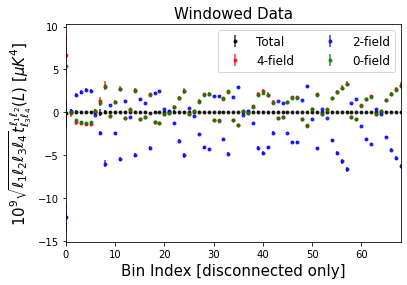

In [22]:
i = option-1
i_arr = np.arange(np.sum(disc_filt))

dweights = np.sqrt(weights)*1e9

# Measured values
t_all = np.asarray(Tl_opts[i]).mean(axis=0)
t4 = np.asarray(Tl_opts_no02[i]).mean(axis=0)
t0 = np.linalg.inv(fishs[i])@np.concatenate([tspec.t0_even_num/tspec.sym_factor_even,tspec.t0_odd_num/tspec.sym_factor_odd])
t2 = t_all-t4-t0
t0_analyt = np.linalg.inv(fishs[0])@t0_num_analyt
t2_analyt = -2*np.linalg.inv(fishs[0])@t0_num_analyt
t4_analyt = np.linalg.inv(fishs[0])@t0_num_analyt
t_analyt = 0.*np.asarray(t0_num_analyt)

# Errors
st_all = np.asarray(Tl_opts[i]).std(axis=0)
st4 = np.asarray(Tl_opts_no02[i]).std(axis=0)
st0 = 0.*t0
st2 = (np.asarray(Tl_opts[i])-np.asarray(Tl_opts_no02[i])-t0).std(axis=0)

# Plot data
plt.errorbar(i_arr,(dweights*t_all)[disc_filt],(dweights*st_all)[disc_filt],
             marker='.',ls='',label='Total',c='k',alpha=0.8)
plt.errorbar(i_arr,(dweights*t4)[disc_filt],(dweights*st4)[disc_filt],
             marker='.',ls='',label='4-field',c='r',alpha=0.8)
plt.errorbar(i_arr,(dweights*t2)[disc_filt],(dweights*st2)[disc_filt],
             marker='.',ls='',label='2-field',c='b',alpha=0.8)
plt.errorbar(i_arr,(dweights*t0)[disc_filt],(dweights*st0)[disc_filt],
             marker='.',ls='',label='0-field',c='g',alpha=0.8)

# Plot errors
if option==1:
    plt.plot(i_arr,(dweights*t4_analyt)[disc_filt],c='r',ls='-',alpha=0.5)
    plt.plot(i_arr,(dweights*t2_analyt)[disc_filt],c='b',ls='-',alpha=0.5)
    plt.plot(i_arr,(dweights*t0_analyt)[disc_filt],c='g',ls='-',alpha=0.5)
    plt.plot(i_arr,(dweights*t_analyt)[disc_filt],c='k',ls='-',alpha=0.5)
plt.xlim(0,len(i_arr)-1)
#plt.yscale('log')
if option==1:
    plt.title("Unwindowed Data",fontsize=15)
else:
    plt.title("Windowed Data",fontsize=15)
plt.legend(fontsize=12,ncol=2)
plt.xlabel(r'Bin Index [disconnected only]',fontsize=15)
plt.ylabel(r'$10^9\sqrt{\ell_1\ell_2\ell_3\ell_4}t^{\ell_1\ell_2}_{\ell_3\ell_4}(L)$ $[\mu K^4]$',fontsize=15);
plt.savefig('testing/Tl_disc%d.pdf'%option,bbox_inches='tight')

### NB: we're really just testing the numerator here, *not* the normalization - this is why this only works for the unwindowed data (the normalization isn't supposed to get the disconnected term correct!)
### Thus we don't plot the prediction if unwindowed!

## Plot Estimates

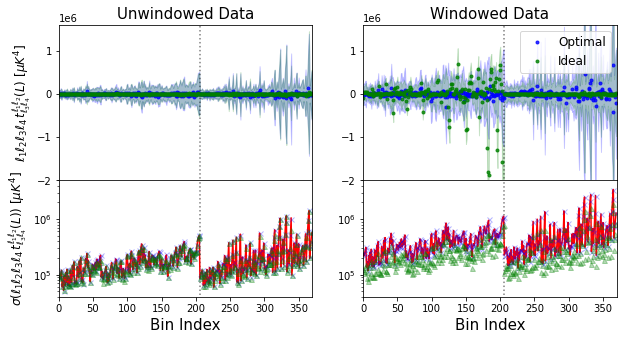

In [23]:
i_arr = np.arange(np.sum(edge_filt))

fig, ax = plt.subplots(2,2,figsize=(10,5),sharex=True,sharey=False,gridspec_kw={'height_ratios': [2,1.5]})
    
for i in [0,1]:
    fig.subplots_adjust(hspace=0)

    inv_fish_opt = np.linalg.inv(fishs[i])
    inv_fish_ideal = np.linalg.inv(fish_ideal)#[i])
    
    fish_err = np.sqrt(np.diag(inv_fish_opt))
    if i==0:
        fish_err_ideal = np.sqrt(np.diag(inv_fish_ideal))
    else:
        fish_err_ideal = np.sqrt(np.diag(inv_fish_ideal))*np.sqrt(np.mean(mask**8)/np.mean(mask**4)**2)    
    
    # Spectra
    ax[0,i].plot(i_arr,(weights*np.asarray(Tl_opts[i]).mean(axis=0))[edge_filt],marker='.',ls='',
                   label='Optimal',c='b',alpha=0.8)
    ax[0,i].fill_between(i_arr,(weights*np.asarray(Tl_opts[i]).mean(axis=0))[edge_filt]-(weights*fish_err)[edge_filt],
                         (weights*np.asarray(Tl_opts[i]).mean(axis=0))[edge_filt]+(weights*fish_err)[edge_filt],
                         color='b',alpha=0.2)
    
    ax[0,i].plot(i_arr,(weights[edge_filt]*np.asarray(Tl_ideals[i]).mean(axis=0)),marker='.',ls='',
                  label='Ideal',c='g',alpha=0.8)
    ax[0,i].fill_between(i_arr,
                         (weights[edge_filt]*np.asarray(Tl_ideals[i]).mean(axis=0))-(weights[edge_filt]*fish_err_ideal),
                         (weights[edge_filt]*np.asarray(Tl_ideals[i]).mean(axis=0))+(weights[edge_filt]*fish_err_ideal),
                         color='g',alpha=0.2)

    # Errors
    ax[1,i].plot(i_arr,(weights*fish_err)[edge_filt],label='Expected error (unwindowed)',c='r',ls='-')
    ax[1,i].plot(i_arr,(weights*np.asarray(Tl_opts[i]).std(axis=0))[edge_filt],label='Unwindowed Error',
               c='b',marker='x',ls='',alpha=0.3,ms=5)
    ax[1,i].plot(i_arr,(weights[edge_filt]*np.asarray(Tl_ideals[i]).std(axis=0)),label='Idealized Error',
               c='g',marker='^',ls='',alpha=0.3,ms=5)

    if i==0:
        ax[0,i].set_title('Unwindowed Data',fontsize=15)
    else:
        ax[0,i].set_title('Windowed Data',fontsize=15)
    ax[1,i].set_xlabel(r'Bin Index',fontsize=15)

    if i==0:
        ax[0,i].set_ylabel(r'$\ell_1\ell_2\ell_3\ell_4\,t^{\ell_1\ell_2}_{\ell_3\ell_4}(L)\,\,[\mu K^4]$',fontsize=12)
        ax[1,i].set_ylabel(r'$\sigma(\ell_1\ell_2\ell_3\ell_4\,t^{\ell_1\ell_2}_{\ell_3\ell_4}(L))\,\,[\mu K^4]$',fontsize=12);
    if i==1:
        ax[0,i].legend(fontsize=12)
    ax[0,i].vlines(i_odd,-1e8,1e8,ls=':',color='k',alpha=0.5)
    ax[1,i].vlines(i_odd,-1e8,1e8,ls=':',color='k',alpha=0.5)
    ax[0,i].set_ylim([-2e6,1.6e6])
    ax[1,i].set_ylim([40000,5000000])
    ax[1,i].set_yscale('log')
    ax[0,i].set_xlim([0,np.sum(edge_filt)])
fig.savefig('testing/Tl_plot.pdf',bbox_inches='tight')

### Note the large differences in windowed data!

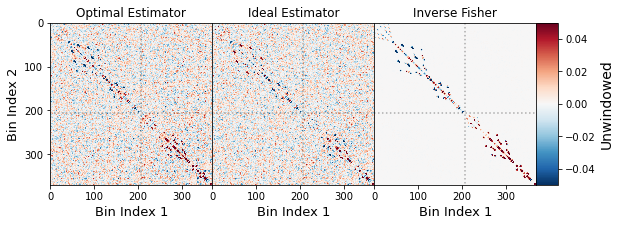

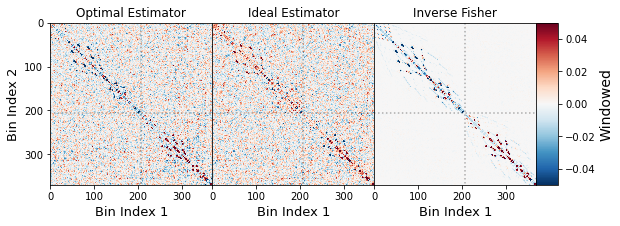

In [24]:
for o in range(2):

    inv_fish_ideal = np.linalg.inv(fish_ideal)
    inv_fish_opt = np.linalg.inv(fishs[o])[edge_filt][:,edge_filt]

    #fish_chol = np.linalg.cholesky(fishs[o]).T
    #cov_unwindowed = np.cov((fish_chol@np.asarray(Tl_opts[o]).T)[edge_filt])

    # Plot correlation matrices
    cov_ideal = np.cov(np.asarray(Tl_ideals[o]).T)
    corr_ideal = cov_ideal/np.sqrt(np.outer(np.diag(cov_ideal),np.diag(cov_ideal)))
    cov_unwindowed = np.cov(np.asarray(Tl_opts[o])[:,edge_filt].T)
    corr_unwindowed = cov_unwindowed/np.sqrt(np.outer(np.diag(cov_unwindowed),np.diag(cov_unwindowed)))
    cov_theory = inv_fish_opt
    corr_theory = cov_theory/np.sqrt(np.outer(np.diag(cov_theory),np.diag(cov_theory)))

    fig,ax = plt.subplots(1,3,figsize=(10,30))
    fig.subplots_adjust(wspace=0)
    v = 0.05
    im=ax[0].imshow(corr_unwindowed-np.eye(len(corr_unwindowed)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
    im=ax[1].imshow(corr_ideal-np.eye(len(corr_ideal)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
    im = ax[2].imshow(corr_theory-np.eye(len(corr_theory)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
    ax[0].set_title("Optimal Estimator")
    ax[1].set_title("Ideal Estimator")
    ax[2].set_title("Inverse Fisher")
    for i in range(3):
        ax[i].set_xticks([0,100,200,300])
        ax[i].set_xticklabels([0,100,200,300])
        ax[i].set_xlabel(r'Bin Index 1',fontsize=13)

        ax[i].hlines(i_odd,0,len(cov_theory),ls=':',color='k',alpha=0.3)
        ax[i].vlines(i_odd,0,len(cov_theory),ls=':',color='k',alpha=0.3)
        ax[i].set_xlim([0,len(cov_theory)])
        ax[i].set_ylim([len(cov_theory),0])

    ax[0].set_yticks([0,100,200,300])
    ax[0].set_yticklabels([0,100,200,300])
    ax[0].set_ylabel(r'Bin Index 2',fontsize=13)
    for i in range(1,3):
        ax[i].set_yticks([])
        ax[i].set_yticklabels([])
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.80, 0.465, 0.03, 0.075])
    cbar=fig.colorbar(im, cax=cbar_ax)
    if o==0:
        cbar.set_label('Unwindowed',fontsize=14)
    elif o==1:
        cbar.set_label('Windowed',fontsize=14)
    fig.savefig('testing/Tl_cov%d.pdf'%o,bbox_inches='tight')

### plot $F^{1/2}d$

0.9819565568853567 0.04390103800206635
5.825410321437844 1.3892092703885672


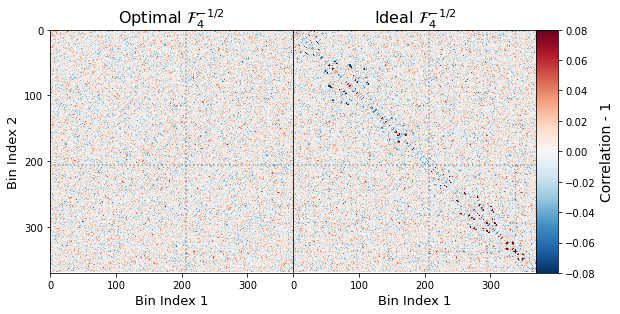

In [31]:
for o in [1]:

    inv_fish_ideal = np.linalg.inv(fish_ideal)
    inv_fish_opt = np.linalg.inv(fishs[o])[edge_filt][:,edge_filt]

    fish_chol = np.linalg.cholesky(fishs[o]).T
    fish_ideal_chol = np.linalg.cholesky(fish_ideal).T
    cov_unwindowed = np.cov((fish_chol@np.asarray(Tl_opts[o]).T)[edge_filt])
    cov_ideal = np.cov((fish_ideal_chol@np.asarray(Tl_opts[o]).T[edge_filt]))

    # Plot correlation matrices
    #cov_ideal = np.cov(np.asarray(Tl_ideals[o]).T)
    corr_ideal = cov_ideal/np.sqrt(np.outer(np.diag(cov_ideal),np.diag(cov_ideal)))
    #cov_unwindowed = np.cov(np.asarray(Tl_opts[o])[:,edge_filt].T)
    corr_unwindowed = cov_unwindowed/np.sqrt(np.outer(np.diag(cov_unwindowed),np.diag(cov_unwindowed)))
    cov_theory = inv_fish_opt
    corr_theory = cov_theory/np.sqrt(np.outer(np.diag(cov_theory),np.diag(cov_theory)))
    print(np.diag(cov_unwindowed).mean(),np.diag(cov_unwindowed).std())
    print(np.diag(cov_ideal).mean(),np.diag(cov_ideal).std())
    
    fig,ax = plt.subplots(1,2,figsize=(10,20))
    fig.subplots_adjust(wspace=0)
    v = 0.08
    im=ax[0].imshow(corr_unwindowed-np.eye(len(corr_unwindowed)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
    im=ax[1].imshow(corr_ideal-np.eye(len(corr_ideal)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
    ax[0].set_title(r"Optimal $\mathcal{F}_4^{-1/2}$",fontsize=16)
    ax[1].set_title(r"Ideal $\mathcal{F}_4^{-1/2}$",fontsize=16)
    for i in range(2):
        ax[i].set_xticks([0,100,200,300])
        ax[i].set_xticklabels([0,100,200,300])
        ax[i].set_xlabel(r'Bin Index 1',fontsize=13)

        ax[i].hlines(i_odd,0,len(cov_theory),ls=':',color='k',alpha=0.3)
        ax[i].vlines(i_odd,0,len(cov_theory),ls=':',color='k',alpha=0.3)
        ax[i].set_xlim([0,len(cov_theory)])
        ax[i].set_ylim([len(cov_theory),0])

    ax[0].set_yticks([0,100,200,300])
    ax[0].set_yticklabels([0,100,200,300])
    ax[0].set_ylabel(r'Bin Index 2',fontsize=13)
    for i in range(1,2):
        ax[i].set_yticks([])
        ax[i].set_yticklabels([])
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.80, 0.418, 0.03, 0.169])
    cbar=fig.colorbar(im, cax=cbar_ax)
    cbar.set_label(r'Correlation - 1',fontsize=14)
    fig.savefig('testing/Tl_Fhalf_cov.pdf',bbox_inches='tight')

# OLD

### Window-free estimator

In [13]:
# Generate MC simulations for estimator numerator
bspec.generate_sims(N_it,b_input=b_input_fac,add_B=True,remove_mean=True)

# # Alternatively, read-in MC simulations created externally
# alpha_sims = []
# for ii in range(N_it):
#     alpha = base.generate_data(seed=10000+ii,add_B=include_synthetic_b, b_input=b_input_fac)
#     alpha_sims.append(alpha)
# bspec.load_sims(alpha_sims, verb=True)

Using 20 Monte Carlo simulations
Computing offset for synthetic maps


In [14]:
fish = bspec.compute_fisher(N_it, N_cpus=4)

Computing Fisher contribution from 20 pairs of Monte Carlo simulations on 4 threads


100%|██████████| 20/20 [19:55<00:00, 59.76s/it]  


In [15]:
b_unwindowed = bspec.Bl_unwindowed(data, verb=True, include_linear_term=True)

Computing b_3 piece
Computing b_1 piece from simulation 5
Computing b_1 piece from simulation 10
Computing b_1 piece from simulation 15
Computing b_1 piece from simulation 20


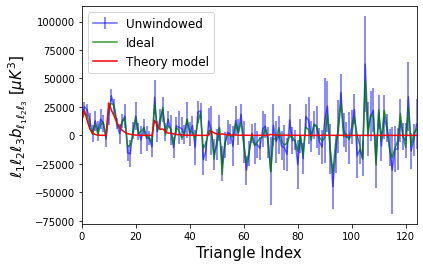

In [16]:
fish_err = np.sqrt(np.diag(np.linalg.inv(bspec.fish)))
plt.errorbar(np.arange(bspec.N_b),weights*b_unwindowed,yerr=weights*fish_err,label='Unwindowed',c='b',alpha=0.6)
plt.errorbar(np.arange(bspec.N_b),weights*b_ideal,label='Ideal',c='g',alpha=0.8)
if include_synthetic_b:
    plt.errorbar(np.arange(bspec.N_b),weights*bl_model,label='Theory model',c='r')
else:
    plt.errorbar(np.arange(bspec.N_b),0.*weights*bl_model,label='Theory model',c='r')
plt.legend(fontsize=12)
plt.xlim([0,bspec.N_b-1])
plt.xlabel("Triangle Index",fontsize=15)
plt.ylabel(r"$\ell_1\ell_2\ell_3 b_{\ell_1\ell_2\ell_3}\,\,[\mu K^3]$",fontsize=15);

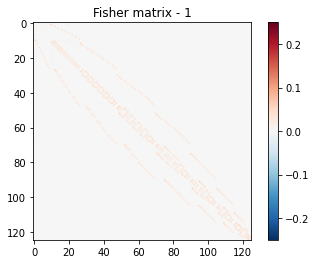

In [17]:
corr_fish_b = bspec.fish/np.sqrt(np.outer(np.diag(bspec.fish),np.diag(bspec.fish)))
v = 0.25
plt.imshow(corr_fish_b-np.eye(len(corr_fish_b)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
plt.title("Fisher matrix - 1")
plt.colorbar();

### Iterate over multiple datasets

In [18]:
b_unwindowed_all = []
b_ideal_all = []

for jj in range(N_sim):
    
    if jj%10==0: 
        print("Analyzing simulation %d of %d"%(jj+1,N_sim))

    # Generate unmasked data
    data = mask*base.generate_data(jj,add_B=include_synthetic_b, b_input=b_input_fac)

    b_ideal_all.append(bspec.Bl_ideal(data))
    b_unwindowed_all.append(bspec.Bl_unwindowed(data,verb=False))

Analyzing simulation 1 of 50
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Analyzing simulation 11 of 50
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Analyzing simulation 21 of 50
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomputed Fisher matrix
Using precomput

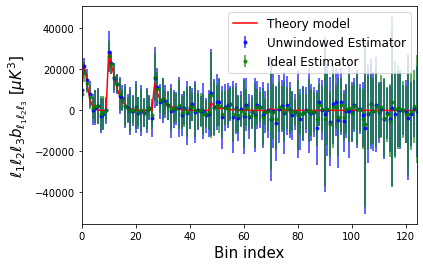

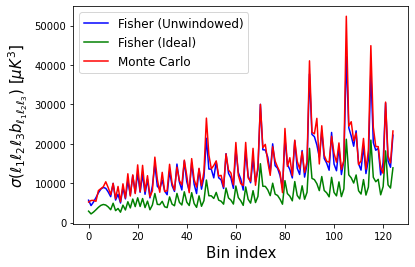

In [19]:
fish_err = np.sqrt(np.diag(bspec.inv_fish))
fish_err_ideal = np.sqrt(np.diag(bspec.inv_fish_ideal))

plt.errorbar(np.arange(bspec.N_b),weights*np.asarray(b_unwindowed_all).mean(axis=0),yerr=weights*fish_err,marker='.',ls='',label='Unwindowed Estimator',c='b',alpha=0.8)
plt.plot(np.arange(bspec.N_b),weights*bl_model,label='Theory model',c='r')
plt.errorbar(np.arange(bspec.N_b),weights*np.asarray(b_ideal_all).mean(axis=0),yerr=weights*np.asarray(b_ideal_all).std(axis=0),
             ls='',marker='.',label='Ideal Estimator',alpha=0.8,c='g')
plt.xlim([0,bspec.N_b-1])
plt.xlabel(r'Bin index',fontsize=15)
plt.ylabel(r'$\ell_1\ell_2\ell_3b_{\ell_1\ell_2\ell_3}\,\,[\mu K^3]$',fontsize=15)
plt.legend(fontsize=12)

plt.figure()
plt.plot(np.arange(bspec.N_b),weights*fish_err,label='Fisher (Unwindowed)',c='b')
plt.plot(np.arange(bspec.N_b),weights*fish_err_ideal,label=r'Fisher (Ideal)',c='g')
plt.plot(np.arange(bspec.N_b),weights*np.asarray(b_unwindowed_all).std(axis=0),label='Monte Carlo',c='r')
plt.xlabel(r'Bin index',fontsize=15)
plt.legend(fontsize=12)
plt.ylabel(r'$\sigma(\ell_1\ell_2\ell_3b_{\ell_1\ell_2\ell_3})\,\,[\mu K^3]$',fontsize=15);

# Trispectrum Estimation

We now consider the trispectrum. Since trispectrum estimation is considerably more expensive, we'll use a broader binning here. In general, calculations would be performed on a cluster, but we'll pick a small problem below for testing on a single computer.

In [1]:
%pylab inline
import healpy
import polybin as pb
from scipy.interpolate import InterpolatedUnivariateSpline

# HEALPix settings
Nside = 128
lmax = 3*Nside-1

# Binning parameters
dl = 30 # width
Nl = 10 # number
min_l = 2 # minimum
print("binned lmax: %d"%(min_l+dl*Nl))

# Number of random iterations to create Fisher matrix
N_it = 20

# Number of simulations to use for testing
N_sim = 50

# Whether to include bins only partially satisfying triangle conditions
include_partial_triangles = False

# whether to add a separable reduced bispectrum to the input maps
include_synthetic_b = True
b_input_fac = lambda l1: np.exp(-(l1-2)/40.)*2e-6

# Galactic Mask
# Using GAL040 mask with 2-degree apodization for testing
root = '/projects/QUIJOTE/Oliver/planck/'
maskfile = 'HFI_Mask_GalPlane-apo2_2048_R2.00.fits'

from classy import Class
cosmo = Class()

# Define ell arrays
l = np.arange(lmax+1)

# Run CLASS
cosmo.set({'output':'tCl,lCl,mPk','l_max_scalars':lmax+1,'lensing':'yes',
           'omega_b':0.022383,
           'non linear':'no',
           'omega_cdm':0.12011,
           'h':0.6732,
           'm_ncdm':0.06,
           'N_ncdm':1,
           'tau_reio':0.0543,
           'A_s':1e-10*np.exp(3.0448),
           'n_s':0.96605});
cosmo.compute()

# Compute signal C_ell
Cl_dict = cosmo.lensed_cl(lmax);
Cl_th = Cl_dict['tt']*cosmo.T_cmb()**2

# Compute noise C_ell
DeltaT = 60./60.*np.pi/180.*1e-6 # in K-radians
thetaFWHM = 5./60.*np.pi/180. # in radians
Nl_th = DeltaT**2*np.exp(l*(l+1)*thetaFWHM**2/(8.*np.log(2)))*(l>2)

mask = healpy.ud_grade(healpy.read_map(root+maskfile,field=1),Nside)

# print("REMOVING MASK")
# mask = np.ones_like(mask)

# Load class
base = pb.PolyBin(Nside,Cl_th+Nl_th)

# Generate unmasked data with known C_l and factorized b
# Cl is set to the fiducial spectrum unless otherwise specified
# No beam is included
raw_data = base.generate_data(seed=42, add_B=include_synthetic_b, b_input=b_input_fac)

# Mask the map
data = raw_data*mask

def applySinv(input_map):
    """Apply the optimal weighting to a map. 
    
    Here, we assume that the forward covariance is diagonal, in particular C_l, and invert this.
    This is not quite the exact solution (as it incorrectly treats W(n) factors), but should be unbiased."""
    
    # Transform to harmonic space
    input_map_lm = base.to_lm(input_map)
    # Divide by covariance and return to map-space
    Cinv_map = base.to_map(base.safe_divide(input_map_lm,base.Cl_lm))
    
    return Cinv_map

Populating the interactive namespace from numpy and matplotlib
binned lmax: 302
Computing offset for synthetic maps


In [2]:
# Initialize trispectrum class
min_l = 10
dl = 20
Nl = 4
tspec = pb.TSpec(base, mask, applySinv, min_l, dl, Nl)

Binning: 4 bins in [10, 90]


In [3]:
fish_odd = tspec.compute_fisher(1,parity='odd',N_cpus=1,verb=True)

Using 121 odd-parity trispectrum bins
Computing Fisher contribution 1 of 1

Generating data

Creating H maps for S-inverse-weighted fields
Computing A[u1,u2] maps for S-inverse-weighted fields
Computing raw Q maps for S-inverse-weighted fields
Assembling Q filters for S-inverse-weighted fields

Creating H maps for U-inverse-weighted fields
Computing A[u1,u2] maps for U-inverse-weighted fields
Computing raw Q maps for U-inverse-weighted fields
Assembling Q filters for U-inverse-weighted fields

Computing Fisher matrix contribution
On bin 1 of 121
On bin 6 of 121
On bin 11 of 121
On bin 16 of 121
On bin 21 of 121
On bin 26 of 121
On bin 31 of 121
On bin 36 of 121
On bin 41 of 121
On bin 46 of 121
On bin 51 of 121
On bin 56 of 121
On bin 61 of 121
On bin 66 of 121
On bin 71 of 121
On bin 76 of 121
On bin 81 of 121
On bin 86 of 121
On bin 91 of 121
On bin 96 of 121
On bin 101 of 121
On bin 106 of 121
On bin 111 of 121
On bin 116 of 121
On bin 121 of 121


In [4]:
tspec.generate_sims(10)

Using 10 Monte Carlo simulations


In [5]:
t_odd = tspec.Tl_unwindowed(data,parity='odd',verb=True)

Computing t0 term
Computing H^+- maps
Computing A maps
Computing A maps for cross-spectra
Assembling parity-odd trispectrum numerator


In [6]:
fish_both = tspec.compute_fisher(1,parity='both',N_cpus=1,verb=True)

Using 154 even-parity trispectrum bins
Computing Fisher contribution 1 of 1

Generating data

Creating H maps for S-inverse-weighted fields
Computing A[u1,u2] maps for S-inverse-weighted fields
Computing raw Q maps for S-inverse-weighted fields
Assembling Q filters for S-inverse-weighted fields

Creating H maps for U-inverse-weighted fields
Computing A[u1,u2] maps for U-inverse-weighted fields
Computing raw Q maps for U-inverse-weighted fields
Assembling Q filters for U-inverse-weighted fields

Computing Fisher matrix contribution
On bin 1 of 154
On bin 6 of 154
On bin 11 of 154
On bin 16 of 154
On bin 21 of 154
On bin 26 of 154
On bin 31 of 154
On bin 36 of 154
On bin 41 of 154
On bin 46 of 154
On bin 51 of 154
On bin 56 of 154
On bin 61 of 154
On bin 66 of 154
On bin 71 of 154
On bin 76 of 154
On bin 81 of 154
On bin 86 of 154
On bin 91 of 154
On bin 96 of 154
On bin 101 of 154
On bin 106 of 154
On bin 111 of 154
On bin 116 of 154
On bin 121 of 154
On bin 126 of 154
On bin 131 of 154

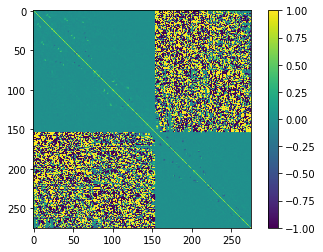

In [10]:
ff = fish_both
corr_fish = ff/np.sqrt(np.outer(np.diag(ff),np.diag(ff)))
plt.imshow(corr_fish,vmax=1,vmin=-1);
plt.colorbar();

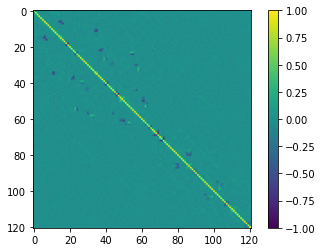

In [7]:
ff = fish_odd
corr_fish = ff/np.sqrt(np.outer(np.diag(ff),np.diag(ff)))
plt.imshow(corr_fish,vmax=1,vmin=-1);
plt.colorbar();

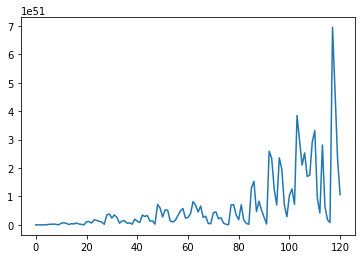

In [8]:
plt.plot(np.diag(fish_odd))

<ErrorbarContainer object of 3 artists>

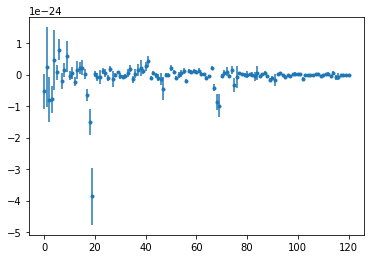

In [9]:
plt.errorbar(np.arange(tspec.N_t_odd),t_odd,yerr=np.sqrt(np.diag(tspec.inv_fish_odd)),ls='',marker='.')

### no mask here!

### a) window is weird??

### b) off-diagonal is weird - should asymptote to zero?

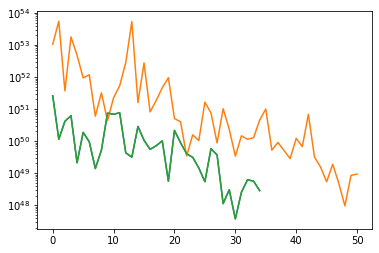

In [20]:
plt.plot(np.abs(np.diag(fish_both)[tspec.N_t_even:]))
plt.plot(np.diag(fish_even))
plt.plot(-np.diag(fish_odd))
plt.yscale('log')

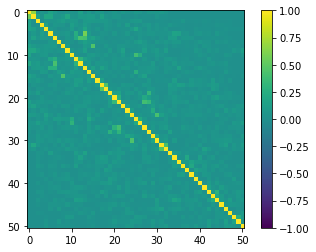

In [40]:
ff = np.abs(fish_even)
corr_fish = ff/np.sqrt(np.outer(np.diag(ff),np.diag(ff)))
plt.imshow(corr_fish,vmax=1,vmin=-1);
plt.colorbar();

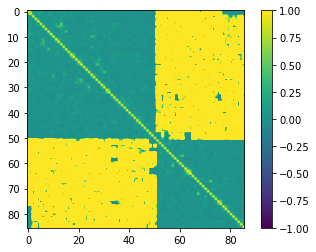

In [43]:
ff = np.abs(fish_both)
corr_fish = ff/np.sqrt(np.outer(np.diag(ff),np.diag(ff)))
plt.imshow(corr_fish,vmax=1,vmin=-1);
plt.colorbar();

In [47]:
tspec.generate_sims(10,Cl_th+Nl_th)

Using 10 Monte Carlo simulations


In [48]:
t_unwindowed_even = tspec.Tl_numerator(data,parity='both',verb=True)

Computing t0 term
Computing t0 term
Computing H^+- maps
Computing A maps
Computing A maps for cross-spectra
Assembling parity-even trispectrum numerator
Assembling parity-odd trispectrum numerator


### cross-terms don't seem to work yet??
### check there's the same symmetry there!

### could check just with a constant window that there's no effects?

## can we use transpose symmetry to drop half the Fisher matrix bins? force index2>index1?

## switch to just computing Im part of trispectrum?
## also helps in Fisher?

In [3]:
t_even, t_odd = tspec.Tl_ideal(data,parity='both',verb=True)

Computing ideal Fisher matrix
Using 51 even-parity trispectrum bins
Using 35 odd-parity trispectrum bins
Computing bin 5 of 51
Computing bin 10 of 51
Computing bin 15 of 51
Computing bin 20 of 51
Computing bin 25 of 51
Computing bin 30 of 51
Computing bin 35 of 51
Computing bin 40 of 51
Computing bin 45 of 51
Computing bin 50 of 51
Computing numerator
Computing H^+- maps
Computing A maps
Assembling parity-even trispectrum numerator
Assembling parity-odd trispectrum numerator


In [4]:
t_even2 = tspec.Tl_ideal(data,parity='even',verb=True)

Using precomputed Fisher matrix
Computing numerator
Computing H^+- maps
Computing A maps
Assembling parity-even trispectrum numerator
